3072 3072


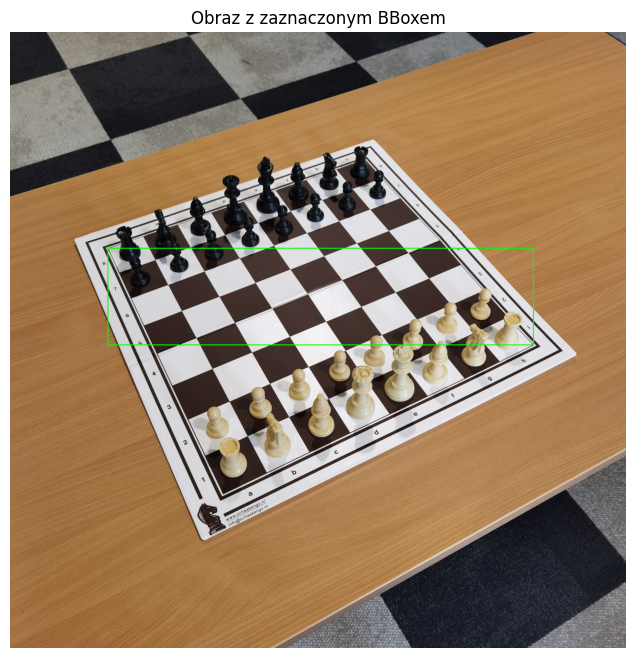

In [11]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
# === Parametry ===
image_path = 'G000_IMG000.jpg'
x1, y1 = 0.15908203125, 0.35113932291666666
x2, y2 = 0.84970703125, 0.5081054687500001 
# === Wczytanie obrazu ===
img = cv2.imread(image_path)


if img is None:
    print("❌ Nie udało się wczytać obrazu.")
else:
    # OpenCV wczytuje w BGR, zamieniamy na RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    print(h,w)

    # === Obliczenie bboxa ===

    # === Rysowanie bboxa ===
    pt1 = (int(min(x1, x2)*w), int(min(y1, y2)*h))
    pt2 = (int(max(x1, x2)*w), int(max(y1, y2)*h))
    cv2.rectangle(img, pt1, pt2, color=(0,255,0), thickness=3)

    # === Wyświetlenie w matplotlib ===
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title("Obraz z zaznaczonym BBoxem")
    plt.axis('off')
    plt.show()


In [1]:
from ultralytics import YOLO

# Ścieżka do pretrenowanego modelu (możesz zmienić na yolov8m.pt, yolov8s.pt itd.)
model_path = "YOLO_models/yolo11n.pt"

# Stworzenie modelu
model = YOLO(model_path)

# Trening
model.train(
    data="dataset/data.yaml",     # Ścieżka do pliku konfiguracyjnego datasetu
    epochs=50,            # Liczba epok
    imgsz=640,            # Rozmiar obrazów wejściowych
    batch=16,             # Rozmiar batcha (zmień jeśli masz GPU/CPU ograniczenia)
    workers=2,            # Liczba workerów do ładowania danych
    project="runs",       # Folder wyjściowy
    name="yolo_chess4",    # Nazwa eksperymentu
    exist_ok=True         # Nadpisanie istniejącego eksperymentu
)

New https://pypi.org/project/ultralytics/8.3.176 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=YOLO_models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_chess4, nbs=64, nms=False, op

KeyboardInterrupt: 

In [4]:

model = YOLO("runs/yolo_chess4/weights/best.pt")
metrics = model.val(split='test')  # użyje images/test/
print(metrics)  # Zwraca mAP, Precision, Recall itd.

Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,584,492 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 138.825.8 MB/s, size: 2165.9 KB)


val: Scanning D:\Chess\backend\dataset\labels\test... 365 images, 1 backgrounds, 0 corrupt: 100%|██████████| 365/365 [00:01<00:00, 347.95it/s]

val: New cache created: D:\Chess\backend\dataset\labels\test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]


                   all        365       6997      0.991      0.988      0.994      0.855
            white-pawn        341       1763      0.995      0.994      0.995      0.835
            white-rook        304        479      0.996      0.996      0.995      0.846
          white-knight        225        329      0.991      0.994      0.995      0.844
          white-bishop        206        351      0.991      0.996      0.995      0.889
           white-queen        193        193      0.989      0.969      0.994      0.878
            white-king        345        350      0.989      0.983      0.987      0.866
            black-pawn        339       1847      0.996      0.997      0.995      0.852
            black-rook        306        487          1       0.99      0.995       0.84
          black-knight        219        324      0.979      0.988      0.992      0.809
          black-bishop        188        341      0.986      0.968      0.992      0.853
           black-quee

In [11]:
model = YOLO("runs/yolo_chess4/weights/best.pt")
model("video",        # lub './images'
                conf=0.25,
                save=True,              # zapisuje nakładki bbox w runs/detect/predict/
                save_txt=True,          # (opc.) zapisuje wyniki do *.txt
                imgsz=640,              # (opc.) rozmiar przeskalowania
)            # (opc.) generator – oszczędza RAM


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 3 white-pawns, 2 white-rooks, 3 white-knights, 2 white-bishops, 1 white-queen, 2 white-kings, 4 black-pawns, 3 black-knights, 3 black-bishops, 4 black-queens, 11.3ms
video 1/1 (frame 2/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 3 white-pawns, 2 white-rooks, 3 white-knights, 4 white-bishops, 1 white-queen, 2 white-kings, 3 black-pawns, 4 black-knights, 4 black

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'white-pawn', 1: 'white-rook', 2: 'white-knight', 3: 'white-bishop', 4: 'white-queen', 5: 'white-king', 6: 'black-pawn', 7: 'black-rook', 8: 'black-knight', 9: 'black-bishop', 10: 'black-queen', 11: 'black-king'}
 obb: None
 orig_img: array([[[185, 185, 185],
         [186, 186, 186],
         [186, 186, 186],
         ...,
         [ 47,  87, 111],
         [ 39,  74,  99],
         [ 37,  72,  97]],
 
        [[178, 178, 178],
         [180, 180, 180],
         [187, 187, 187],
         ...,
         [ 47,  87, 111],
         [ 40,  75, 100],
         [ 38,  73,  98]],
 
        [[185, 185, 185],
         [180, 180, 180],
         [187, 187, 187],
         ...,
         [ 47,  84, 109],
         [ 41,  76, 101],
         [ 39,  74,  99]],
 
        ...,
 
        [[117, 132, 140],
         [163, 178, 186],
         [160, 172, 194],
  

In [12]:
results = model.track(
        source="video",
        tracker="botsort.yaml",   # lub 'bytetrack.yaml'
        persist=True,             # utrzymuj tę samą instancję trackera
        conf=0.25,                # próg ufności
        save=True) 

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
   ---------------------------------------- 1.5/1.5 MB 43.5 kB/s eta 0:00:00

requirements: AutoUpdate success  37.2s
WARNING requirements: Restart runtime or rerun command for updates to take effect


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 3 white-pawns, 2 white-rooks, 3 white-knights, 2 white-bishops, 1 white-queen, 2 white-k

In [2]:
from ultralytics import YOLO
from collections import defaultdict, Counter, deque
import torch
model = YOLO("runs/yolo_chess4/weights/best.pt")
history = defaultdict(lambda: deque(maxlen=5))   # track_id -> ostatnie 5 klas

for r in model.track(source="video", stream=True, persist=True,
                     tracker="botsort.yaml", conf=0.35):
    # 1️⃣ Jeśli w tej klatce nie ma id‑ków, pomijamy
    if r.boxes.id is None:
        continue

    # 2️⃣ Konwersja na czyste int‑y
    ids  = r.boxes.id.cpu().numpy().astype(int)
    clss = r.boxes.cls.cpu().numpy().astype(int)

    # 3️⃣ Aktualizacja historii i wybór stabilnej klasy
    for tid, cls in zip(ids, clss):
        history[tid].append(cls)                          # dodaj nową klasę
        stable_cls = Counter(history[tid]).most_common(1)[0][0]

        # 4️⃣ Nadpisujemy predykcję w tensorze wynikowym
        mask = (r.boxes.id == tid)                        # tensor bool
        r.boxes.cls[mask] = torch.tensor(stable_cls,      # dtype zgodny
                                         device=r.boxes.cls.device)


video 1/1 (frame 1/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 3 white-pawns, 1 white-rook, 3 white-knights, 2 white-bishops, 1 white-queen, 2 white-kings, 3 black-pawns, 2 black-knights, 2 black-bishops, 4 black-queens, 57.8ms


RuntimeError: Inplace update to inference tensor outside InferenceMode is not allowed.You can make a clone to get a normal tensor before doing inplace update.See https://github.com/pytorch/rfcs/pull/17 for more details.

In [ ]:
model = YOLO("runs/yolo_chess4/weights/best.pt")
          

(480, 640, 3)


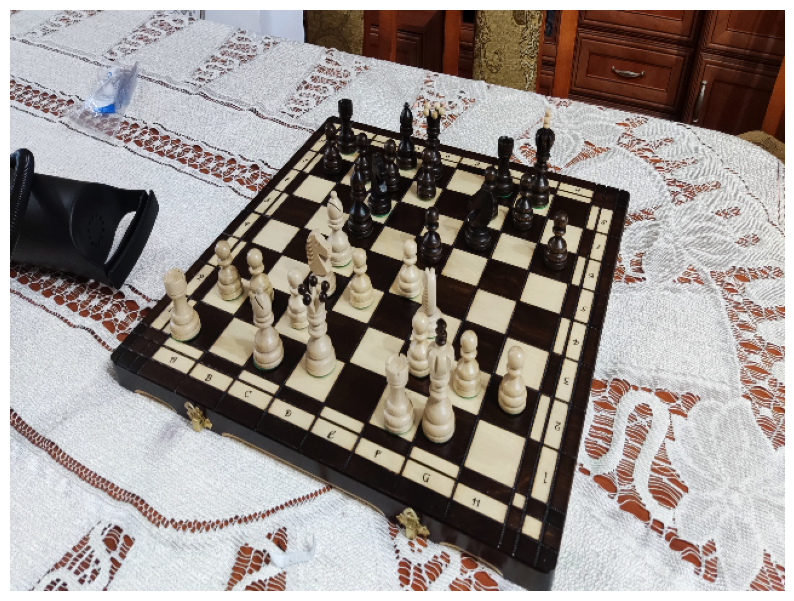

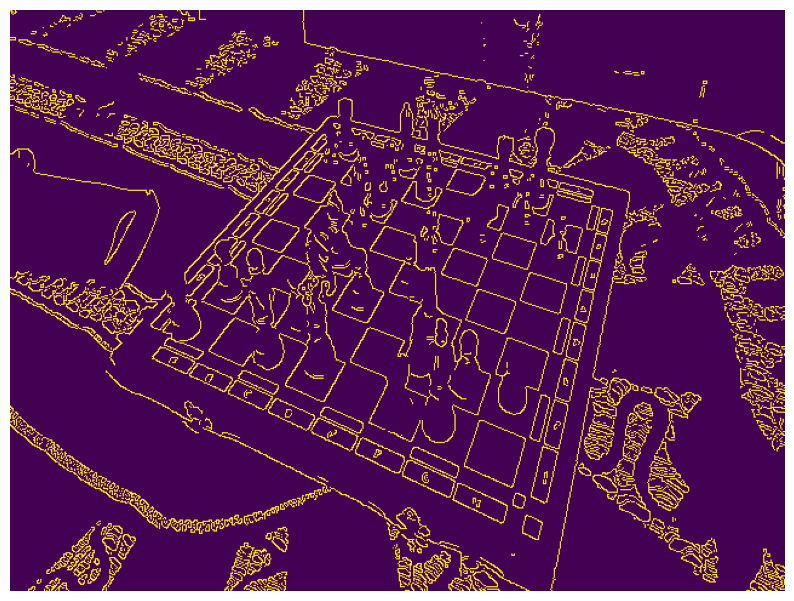

[[[447 479 511 151]]

 [[  0  79 221 163]]

 [[435 437 501 148]]

 [[245  28 600 104]]

 [[118 288 383 412]]

 [[241 330 434 420]]

 [[423 429 493 146]]

 [[ 84 103 234 152]]

 [[  4  82 220 165]]

 [[107  57 260 107]]

 [[166 296 456 431]]

 [[ 72  86 238 146]]

 [[ 87 307 322 422]]

 [[ 83 282 271  80]]

 [[ 90  99 236 149]]

 [[237 344 453 445]]

 [[474 359 583 468]]

 [[ 78 103 239 155]]

 [[144 430 269 397]]

 [[246 208 408 267]]

 [[ 82  86 268 143]]

 [[451 362 578 472]]

 [[284 103 480 155]]

 [[231  80 508 149]]

 [[ 90  98 244 140]]

 [[  0  67 246 137]]

 [[476 366 582 472]]

 [[424 357 568 318]]

 [[123 121 229 153]]

 [[352 245 579 472]]

 [[227  85 477 148]]

 [[  2 222 102 263]]

 [[  0  59 161 109]]

 [[ 26 220 192 294]]

 [[154 428 272 399]]

 [[177 352 367 445]]

 [[219  89 335 194]]

 [[131 290 366  55]]

 [[ 90 102 255 159]]

 [[117 259 282  76]]

 [[224  86 478 154]]

 [[ 73  87 310 173]]

 [[260 257 375  72]]

 [[144 222 282 177]]

 [[115  59 260 103]]

 [[190 305

ValueError: too many values to unpack (expected 2)

In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def cluster_lines(lines, threshold=20):
    lines = sorted(lines, key=lambda x: x[0])  # sort po rho
    clusters = []
    current_cluster = [lines[0]]

    for line in lines[1:]:
        if abs(line[0] - current_cluster[-1][0]) < threshold:
            current_cluster.append(line)
        else:
            clusters.append(current_cluster)
            current_cluster = [line]
    clusters.append(current_cluster)

    # średnia z każdej grupy
    return [tuple(np.mean(cluster, axis=0)) for cluster in clusters]

def plot_cv(img):
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()


image_path = 'sample/test3.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

resized = cv2.resize(image, (640, 480))  # szerokość, wysokość!
print(resized.shape)

gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray, 300, 450)

plot_cv(resized)
plot_cv(edges)
lines = cv2.HoughLinesP(
    edges,
    rho=1,
    theta=np.pi/180,
    threshold=50,
    minLineLength=100,
    maxLineGap=20
)
# lines= cluster_lines(lines, threshold=20)
print(lines)
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(resized, (x1,y1), (x2,y2), (0,0,255), 2)

lines_to_intersect = list(set([line_border_points(resized, line) for line in lines]))
print(lines_to_intersect)
print(len(lines_to_intersect))
plot_cv(resized)
points_of_intersect = find_intersection.find_intersections(lines_to_intersect)
print(points_of_intersect)


# H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)


In [51]:
import find_intersection
def line_border_points(image, line):
    h, w, _ = image.shape
    rho, theta = line[0]
    points = []
    cos_t = np.cos(theta)
    sin_t = np.sin(theta)

    # y = 0
    if sin_t != 0:
        x = (rho - 0 * sin_t) / cos_t
        if 0 <= x <= w:
            points.append((int(x), 0))

    # y = h
    if sin_t != 0:
        x = (rho - h * sin_t) / cos_t
        if 0 <= x <= w:
            points.append((int(x), h))

    # x = 0
    if cos_t != 0:
        y = (rho - 0 * cos_t) / sin_t
        if 0 <= y <= h:
            points.append((0, int(y)))

    # x = w
    if cos_t != 0:
        y = (rho - w * cos_t) / sin_t
        if 0 <= y <= h:
            points.append((w, int(y)))

    if len(points) != 2:
        assert "zjebało sie"
    points.sort(key=lambda x: x[0])
    return tuple(points)



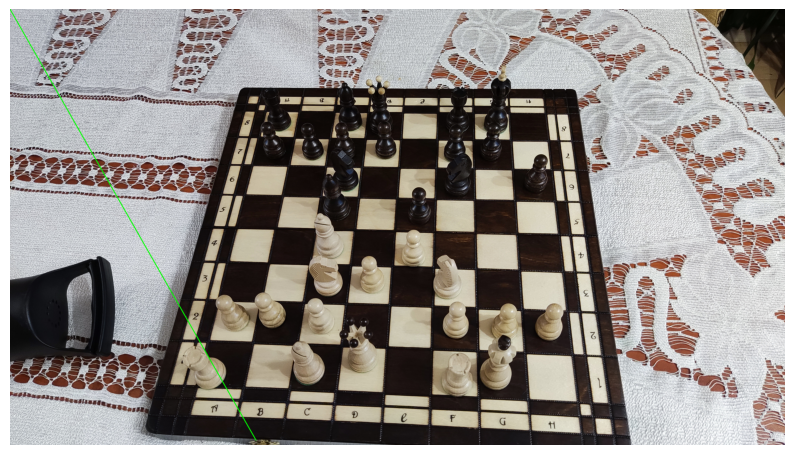

In [97]:
image_path = 'sample/test4.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

resized = cv2.resize(image, (640, 480))
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Binaryzacja (możesz też użyć adaptiveThreshold)
thresh = cv2.adaptiveThreshold(
    gray,                  # obraz wejściowy w skali szarości
    255,                   # wartość maksymalna po binaryzacji
    cv2.ADAPTIVE_THRESH_MEAN_C,  # metoda adaptacyjna (można też użyć GAUSSIAN_C)
    cv2.THRESH_BINARY,     # typ binaryzacji
    11,                    # rozmiar sąsiedztwa (blok 11x11)
    2                      # stała odejmowana od średniej (C)
)

# Znalezienie konturów
contours, hierarchy = cv2.findContours(
    thresh, 
    cv2.RETR_EXTERNAL,   # tylko kontury zewnętrzne
    cv2.CHAIN_APPROX_SIMPLE
)

# Posortuj kontury po polu powierzchni (największy to plansza)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Weź największy kontur i przybliż go do wielokąta
board_contour = contours[0]
epsilon = 0.02 * cv2.arcLength(board_contour, True)
approx = cv2.approxPolyDP(board_contour, epsilon, True)

# Rysowanie konturu
output = image.copy()
cv2.drawContours(output, [approx], -1, (0, 255, 0), 3)

plot_cv(output)
# Wyświetlenie

=== INTELIGENTNA DETEKCJA PÓL ===

1. Szukanie konturów pól...
=== DETEKCJA PRZEZ POLA SZACHOWNICY ===
Znaleziono 17198 konturów
Znaleziono 8 potencjalnych pól szachownicy


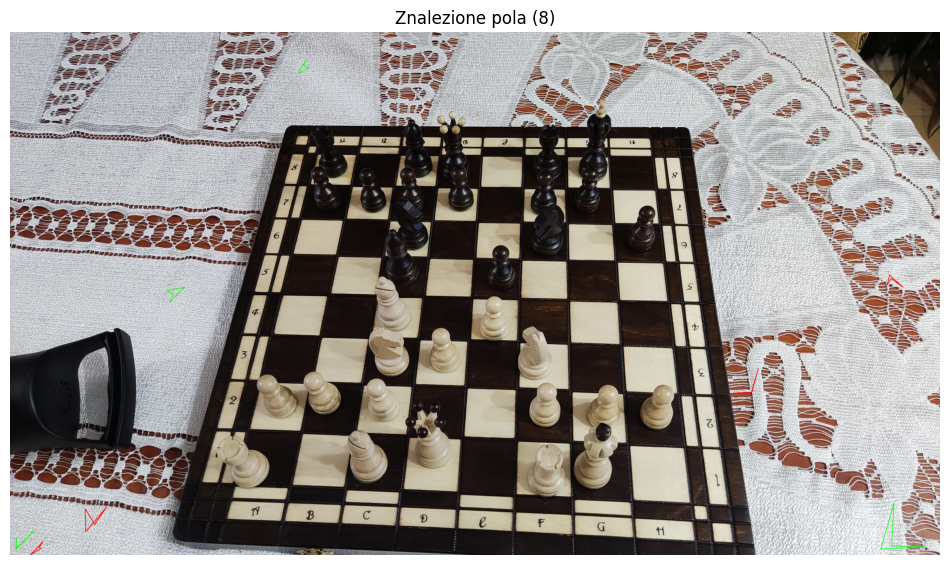

Średni rozmiar pola: 91.8
Znaleziono 8 rzędów i 8 kolumn


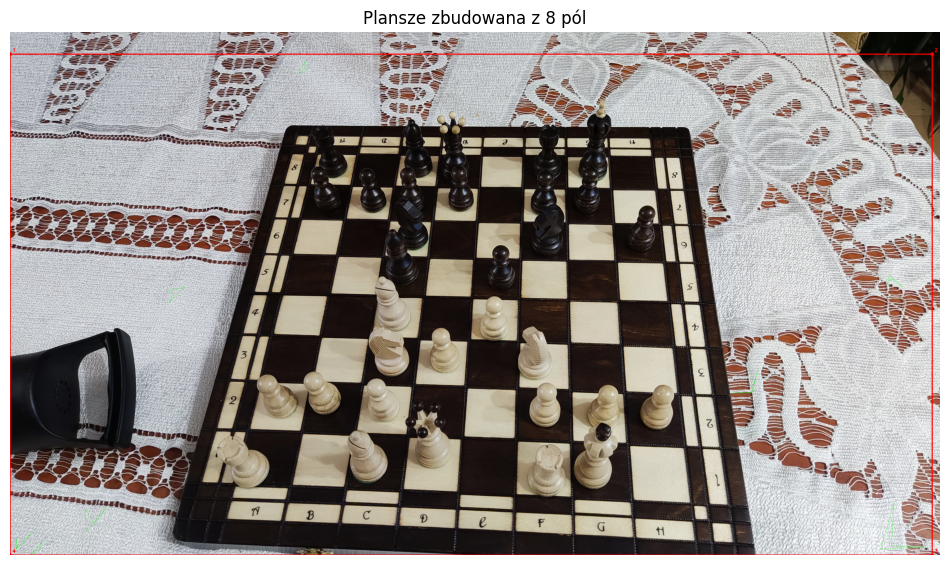

Narożniki planszy: [(0, 99), (3966, 99), (3966, 2250), (0, 2250)]

2. Analiza wzoru jasne/ciemne...
Znaleziono 14192 jasnych i 5842 ciemnych pól


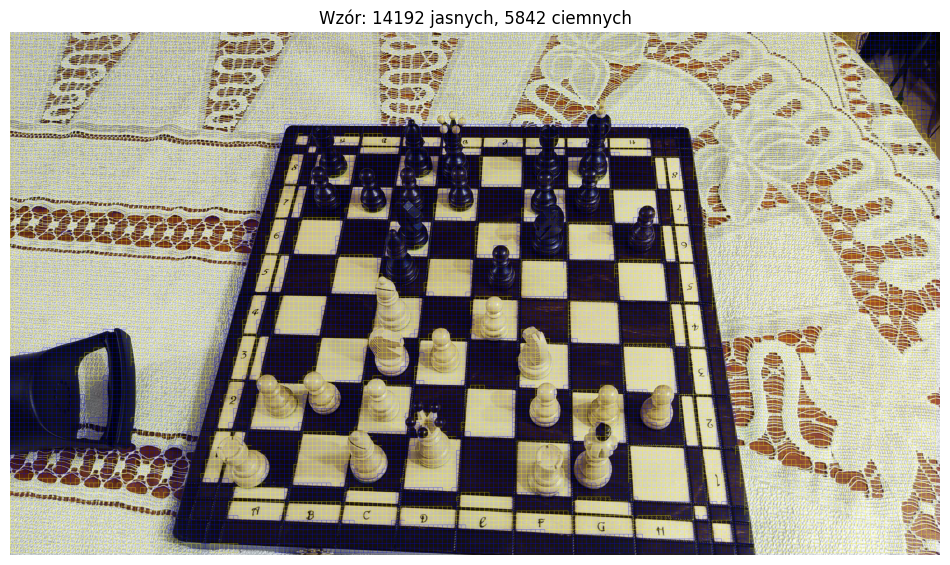


3. Template matching...
Template matching: 8819591 dopasowań


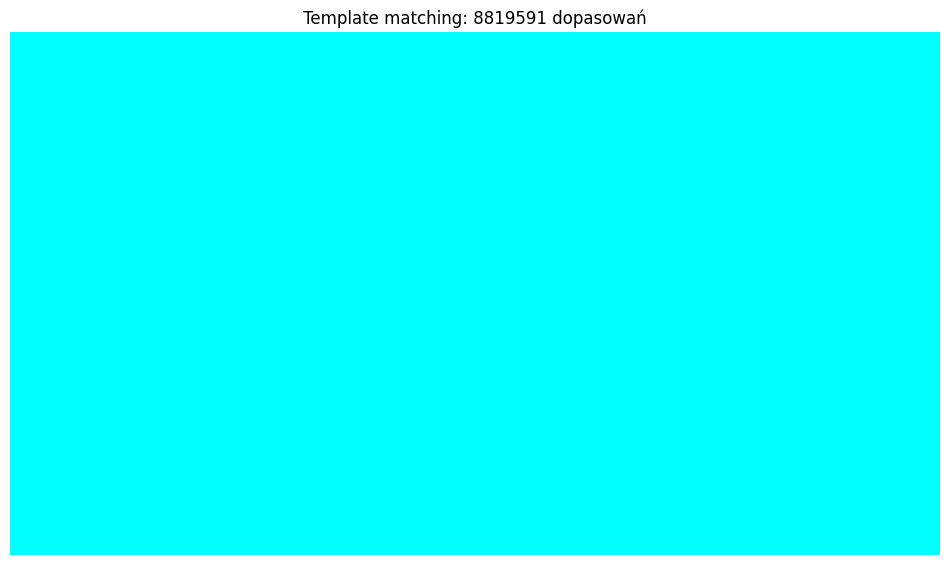


PORADY DOTYCZĄCE DOSTRAJANIA:
1. W funkcji find_chess_squares() dostosuj zakres 'area':
   - Jeśli pola są małe: zmień (200, 5000) na (50, 2000)
   - Jeśli pola są duże: zmień na (1000, 10000)
2. W detect_alternating_pattern() dostosuj 'square_size'
3. Dostosuj progi jasności (120 dla jasnych, 80 dla ciemnych)
4. Zmień tolerance w build_chessboard_grid() jeśli pola się nie grupują


In [108]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def plot_cv(image, title="Obraz"):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

def find_chess_squares(image_path):
    """
    Znajdź pojedyncze pola szachownicy (kwadraty/prostokąty)
    """
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    
    # Preprocessing - znajdź krawędzie pól
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(blurred, 30, 100)
    
    # Znajdź kontury
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    squares = []
    result = image_rgb.copy()
    
    print(f"Znaleziono {len(contours)} konturów")
    
    for i, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        
        # Filtruj po rozmiarze (pola szachownicy powinny mieć podobny rozmiar)
        if 200 < area < 5000:  # Dostosuj zakres do rozmiaru Twojej szachownicy
            # Aproksymuj do prostokąta
            peri = cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, 0.02 * peri, True)
            
            # Sprawdź czy to prostokąt (4 punkty)
            if len(approx) == 4:
                # Sprawdź proporcje (pole powinno być kwadratowe)
                x, y, w, h = cv2.boundingRect(approx)
                aspect_ratio = float(w) / h
                
                if 0.7 < aspect_ratio < 1.4:  # Prawie kwadratowy
                    squares.append({
                        'contour': approx,
                        'center': (x + w//2, y + h//2),
                        'size': (w, h),
                        'area': area,
                        'bbox': (x, y, w, h)
                    })
                    
                    # Narysuj znalezione pole
                    color = (0, 255, 0) if len(squares) % 2 == 0 else (255, 0, 0)
                    cv2.drawContours(result, [approx], -1, color, 2)
                    cv2.putText(result, str(len(squares)), (x, y-5), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    
    print(f"Znaleziono {len(squares)} potencjalnych pól szachownicy")
    plot_cv(result, f"Znalezione pola ({len(squares)})")
    
    return squares, result

def build_chessboard_grid(squares):
    """
    Zbuduj siatkę szachownicy z pojedynczych pól
    """
    if len(squares) < 4:
        print("Za mało pól do zbudowania siatki")
        return None, None
    
    # Pogrupuj pola według pozycji Y (rzędy)
    rows = defaultdict(list)
    cols = defaultdict(list)
    
    # Tolerancja dla grupowania (pola w tym samym rzędzie/kolumnie)
    tolerance = 20
    
    # Znajdź średni rozmiar pola
    avg_size = np.mean([s['size'][0] for s in squares])
    
    print(f"Średni rozmiar pola: {avg_size:.1f}")
    
    # Grupuj według Y (rzędy)
    for square in squares:
        center_y = square['center'][1]
        
        # Znajdź najbliższy istniejący rząd
        best_row = None
        min_dist = tolerance
        
        for row_y in rows.keys():
            dist = abs(center_y - row_y)
            if dist < min_dist:
                min_dist = dist
                best_row = row_y
        
        if best_row is not None:
            rows[best_row].append(square)
        else:
            rows[center_y] = [square]
    
    # Grupuj według X (kolumny)
    for square in squares:
        center_x = square['center'][0]
        
        best_col = None
        min_dist = tolerance
        
        for col_x in cols.keys():
            dist = abs(center_x - col_x)
            if dist < min_dist:
                min_dist = dist
                best_col = col_x
        
        if best_col is not None:
            cols[best_col].append(square)
        else:
            cols[center_x] = [square]
    
    print(f"Znaleziono {len(rows)} rzędów i {len(cols)} kolumn")
    
    # Posortuj rzędy i kolumny
    sorted_rows = sorted(rows.keys())
    sorted_cols = sorted(cols.keys())
    
    return rows, cols, sorted_rows, sorted_cols

def find_board_boundaries_from_squares(squares, image_shape):
    """
    Znajdź granice całej planszy na podstawie skrajnych pól
    """
    if not squares:
        return None
    
    # Znajdź skrajne pozycje
    min_x = min(s['bbox'][0] for s in squares)
    min_y = min(s['bbox'][1] for s in squares)  
    max_x = max(s['bbox'][0] + s['bbox'][2] for s in squares)
    max_y = max(s['bbox'][1] + s['bbox'][3] for s in squares)
    
    # Dodaj margines (ramka szachownicy)
    avg_size = np.mean([s['size'][0] for s in squares])
    margin = int(avg_size * 0.3)  # 30% rozmiaru pola jako margines
    
    min_x = max(0, min_x - margin)
    min_y = max(0, min_y - margin)
    max_x = min(image_shape[1], max_x + margin)
    max_y = min(image_shape[0], max_y + margin)
    
    corners = [
        (min_x, min_y),      # lewy górny
        (max_x, min_y),      # prawy górny
        (max_x, max_y),      # prawy dolny
        (min_x, max_y)       # lewy dolny
    ]
    
    return corners

def detect_chessboard_by_fields(image_path):
    """
    Główna funkcja - znajdź szachownicę przez pola
    """
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    print("=== DETEKCJA PRZEZ POLA SZACHOWNICY ===")
    
    # Krok 1: Znajdź pojedyncze pola
    squares, squares_result = find_chess_squares(image_path)
    
    if len(squares) < 4:
        print("Za mało pól - spróbuj dostosować parametry")
        return squares_result, None
    
    # Krok 2: Zbuduj siatkę
    rows, cols, sorted_rows, sorted_cols = build_chessboard_grid(squares)
    
    # Krok 3: Znajdź granice planszy
    corners = find_board_boundaries_from_squares(squares, image_rgb.shape)
    
    if corners:
        result = image_rgb.copy()
        
        # Narysuj znalezione pola
        for square in squares:
            cv2.drawContours(result, [square['contour']], -1, (0, 255, 0), 1)
        
        # Narysuj granice planszy
        pts = np.array(corners, np.int32)
        cv2.polylines(result, [pts], True, (255, 0, 0), 3)
        
        # Zaznacz narożniki
        for i, corner in enumerate(corners):
            cv2.circle(result, corner, 8, (255, 0, 0), -1)
            cv2.putText(result, str(i+1), (corner[0]+10, corner[1]-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
        
        plot_cv(result, f"Plansze zbudowana z {len(squares)} pól")
        
        print(f"Narożniki planszy: {corners}")
        return result, corners
    
    return squares_result, None

def detect_alternating_pattern(image_path):
    """
    Znajdź wzór szachownicy - naprzemienne jasne/ciemne pola
    """
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    
    # Znajdź pola o różnej jasności
    light_squares = []
    dark_squares = []
    
    # Podziel obraz na możliwe pola (siatka)
    h, w = gray.shape
    square_size = 40  # Szacowany rozmiar pola - dostosuj!
    
    result = image_rgb.copy()
    
    for y in range(0, h - square_size, square_size // 2):
        for x in range(0, w - square_size, square_size // 2):
            # Wytnij potencjalne pole
            roi = gray[y:y+square_size, x:x+square_size]
            
            if roi.size > 0:
                avg_brightness = np.mean(roi)
                
                # Klasyfikuj jako jasne lub ciemne
                if avg_brightness > 120:  # Jasne pole
                    light_squares.append((x, y, square_size, square_size, avg_brightness))
                    cv2.rectangle(result, (x, y), (x+square_size, y+square_size), (255, 255, 0), 1)
                elif avg_brightness < 80:  # Ciemne pole
                    dark_squares.append((x, y, square_size, square_size, avg_brightness))
                    cv2.rectangle(result, (x, y), (x+square_size, y+square_size), (0, 0, 255), 1)
    
    print(f"Znaleziono {len(light_squares)} jasnych i {len(dark_squares)} ciemnych pól")
    
    if len(light_squares) > 0 and len(dark_squares) > 0:
        plot_cv(result, f"Wzór: {len(light_squares)} jasnych, {len(dark_squares)} ciemnych")
        return result, light_squares, dark_squares
    
    return result, [], []

def smart_field_detection(image_path):
    """
    Inteligentna detekcja - kombinuje różne metody
    """
    print("=== INTELIGENTNA DETEKCJA PÓL ===")
    
    # Metoda 1: Kontury pól
    print("\n1. Szukanie konturów pól...")
    result1, corners1 = detect_chessboard_by_fields(image_path)
    
    # Metoda 2: Wzór jasne/ciemne
    print("\n2. Analiza wzoru jasne/ciemne...")
    result2, light, dark = detect_alternating_pattern(image_path)
    
    # Metoda 3: Template matching małych kwadratów
    print("\n3. Template matching...")
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    
    # Stwórz szablon pojedynczego pola
    template_size = 30
    template = np.ones((template_size, template_size), dtype=np.uint8) * 255
    
    # Template matching
    res = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF_NORMED)
    threshold = 0.6
    loc = np.where(res >= threshold)
    
    result3 = image_rgb.copy()
    matches = 0
    
    for pt in zip(*loc[::-1]):
        cv2.rectangle(result3, pt, (pt[0] + template_size, pt[1] + template_size), (0, 255, 255), 1)
        matches += 1
    
    print(f"Template matching: {matches} dopasowań")
    plot_cv(result3, f"Template matching: {matches} dopasowań")
    
    return result1, result2, result3

# GŁÓWNE WYWOŁANIE
image_path = 'sample/test4.jpg'

# Uruchom inteligentną detekcję
result1, result2, result3 = smart_field_detection(image_path)

print("\n" + "="*60)
print("PORADY DOTYCZĄCE DOSTRAJANIA:")
print("1. W funkcji find_chess_squares() dostosuj zakres 'area':")
print("   - Jeśli pola są małe: zmień (200, 5000) na (50, 2000)")  
print("   - Jeśli pola są duże: zmień na (1000, 10000)")
print("2. W detect_alternating_pattern() dostosuj 'square_size'")
print("3. Dostosuj progi jasności (120 dla jasnych, 80 dla ciemnych)")
print("4. Zmień tolerance w build_chessboard_grid() jeśli pola się nie grupują")
print("="*60)

## Drugi model


In [12]:
from ultralytics import YOLO

# Ścieżka do pretrenowanego modelu (możesz zmienić na yolov8m.pt, yolov8s.pt itd.)
model_path = "YOLO_models/yolo11n-seg.pt"

# Stworzenie modelu
model = YOLO(model_path)

# Trening
model.train(
    data="dataset_board/data.yaml",     # Ścieżka do pliku konfiguracyjnego datasetu
    epochs=50,            # Liczba epok
    imgsz=640,            # Rozmiar obrazów wejściowych
    batch=16,             # Rozmiar batcha (zmień jeśli masz GPU/CPU ograniczenia)
    workers=2,            # Liczba workerów do ładowania danych
    project="runs",       # Folder wyjściowy
    name="yolo_board",    # Nazwa eksperymentu
    exist_ok=True         # Nadpisanie istniejącego eksperymentu
)

New https://pypi.org/project/ultralytics/8.3.176 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_board/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=YOLO_models/yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_board, nbs=64, nms=

train: Scanning D:\Chess\backend\dataset_board\labels\train.cache... 1442 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1442/1442 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.0 ms, read: 267.153.7 MB/s, size: 1766.4 KB)


val: Scanning D:\Chess\backend\dataset_board\labels\val.cache... 330 images, 0 backgrounds, 0 corrupt: 100%|██████████| 330/330 [00:00<?, ?it/s]


Plotting labels to runs\yolo_board\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs\yolo_board
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.61G     0.6774      3.054      1.505      1.155          6        640: 100%|██████████| 91/91 [01:02<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.08it/s]


                   all        330        330       0.97      0.888      0.988      0.819      0.823      0.755      0.728      0.241

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.09G      0.565      2.412     0.8158      1.053          8        640: 100%|██████████| 91/91 [01:32<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.59it/s]


                   all        330        330      0.881      0.941      0.965      0.777      0.607      0.691      0.468      0.103

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.07G     0.5733      2.278     0.6537      1.049          5        640: 100%|██████████| 91/91 [01:03<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.02it/s]


                   all        330        330      0.979      0.988      0.993      0.926      0.948      0.961      0.936      0.408

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.67G     0.5079      2.114     0.5349      1.021          2        640: 100%|██████████| 91/91 [01:04<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.00it/s]

                   all        330        330      0.961      0.997      0.986      0.845      0.911      0.945      0.907      0.281



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.12G     0.5336      2.003     0.5007      1.018          5        640: 100%|██████████| 91/91 [01:31<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.45it/s]


                   all        330        330      0.986      0.985      0.994      0.909      0.938      0.936      0.916      0.389

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.63G     0.4888       1.86     0.4592      1.004          4        640: 100%|██████████| 91/91 [01:02<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.01it/s]

                   all        330        330       0.99          1      0.995       0.94      0.988      0.997      0.995      0.529



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.09G     0.4413      1.734     0.4263     0.9763          4        640: 100%|██████████| 91/91 [01:02<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:12<00:00,  1.13s/it]

                   all        330        330      0.994      0.997      0.995      0.954      0.994      0.997      0.995      0.579



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.98G     0.4492      1.722     0.4139     0.9841          6        640: 100%|██████████| 91/91 [01:04<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.17it/s]


                   all        330        330      0.978          1      0.995      0.954      0.975      0.997      0.993      0.555

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.67G     0.4231      1.604     0.3798     0.9649          3        640: 100%|██████████| 91/91 [00:59<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.33it/s]

                   all        330        330      0.999          1      0.995      0.963      0.999          1      0.995      0.648



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50       4.6G     0.4314      1.537     0.3929     0.9767          8        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.33it/s]

                   all        330        330      0.999          1      0.995      0.972      0.993      0.994      0.993      0.615



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.98G      0.406      1.524     0.3691     0.9619          7        640: 100%|██████████| 91/91 [00:58<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.07it/s]

                   all        330        330      0.997          1      0.995      0.974      0.991      0.994      0.989      0.654



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.01G     0.3779      1.394     0.3478     0.9567          3        640: 100%|██████████| 91/91 [01:01<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.60it/s]

                   all        330        330      0.994          1      0.995      0.981      0.994          1      0.995      0.712



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.61G      0.379       1.38     0.3415     0.9488          6        640: 100%|██████████| 91/91 [00:58<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.31it/s]

                   all        330        330      0.999          1      0.995      0.979      0.996      0.997      0.995      0.739



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50         5G     0.3691      1.282     0.3391     0.9412          8        640: 100%|██████████| 91/91 [01:01<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.57it/s]

                   all        330        330      0.999          1      0.995      0.981      0.999          1      0.995        0.7



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.98G     0.3539      1.277      0.324     0.9407          7        640: 100%|██████████| 91/91 [00:58<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.55it/s]

                   all        330        330          1          1      0.995      0.969          1          1      0.995       0.75



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.58G     0.3475      1.356     0.3245     0.9353          3        640: 100%|██████████| 91/91 [00:57<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.33it/s]

                   all        330        330      0.994          1      0.995      0.982      0.994          1      0.995      0.773



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.55G      0.336      1.208      0.317     0.9264          4        640: 100%|██████████| 91/91 [00:57<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.35it/s]

                   all        330        330          1          1      0.995      0.986          1          1      0.995      0.773



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.98G     0.3394      1.198     0.3124      0.933          6        640: 100%|██████████| 91/91 [01:00<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.14it/s]

                   all        330        330          1          1      0.995      0.981          1          1      0.995      0.774



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50         5G     0.3249      1.165     0.3012     0.9285          7        640: 100%|██████████| 91/91 [01:03<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.48it/s]

                   all        330        330          1          1      0.995      0.982          1          1      0.995      0.772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.98G     0.3053      1.105     0.2884     0.9141          4        640: 100%|██████████| 91/91 [01:09<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]

                   all        330        330      0.999          1      0.995      0.984      0.999          1      0.995      0.782



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.98G     0.3119      1.064     0.2839     0.9157          5        640: 100%|██████████| 91/91 [01:10<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.14it/s]

                   all        330        330      0.999          1      0.995      0.983      0.999          1      0.995      0.801



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.99G     0.3214      1.113      0.288     0.9301          3        640: 100%|██████████| 91/91 [01:06<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:11<00:00,  1.04s/it]

                   all        330        330      0.993          1      0.995      0.983      0.993          1      0.995      0.794



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50       4.6G     0.3097      1.043     0.2893     0.9146          6        640: 100%|██████████| 91/91 [01:01<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.12it/s]

                   all        330        330          1          1      0.995       0.98          1          1      0.995      0.772



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.58G      0.305      1.023     0.2886     0.9178          2        640: 100%|██████████| 91/91 [01:08<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  1.91it/s]

                   all        330        330      0.999          1      0.995      0.984      0.999          1      0.995      0.825



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.99G     0.2972      1.054     0.2765     0.9168          4        640: 100%|██████████| 91/91 [01:10<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.45it/s]

                   all        330        330          1          1      0.995      0.985          1          1      0.995      0.818



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.98G      0.301      1.018     0.2757     0.9129          6        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]

                   all        330        330      0.988          1      0.993      0.984      0.988          1      0.993      0.816



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.56G     0.2876     0.9513     0.2663     0.9104          6        640: 100%|██████████| 91/91 [00:54<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.33it/s]

                   all        330        330      0.997      0.998      0.995      0.981      0.997      0.998      0.995      0.835



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50       4.6G     0.2838     0.9505     0.2599     0.9101          6        640: 100%|██████████| 91/91 [00:55<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.17it/s]

                   all        330        330      0.999          1      0.995      0.988      0.999          1      0.995      0.814



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50         5G     0.2852     0.9349     0.2629     0.9087          5        640: 100%|██████████| 91/91 [00:59<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.61it/s]

                   all        330        330          1          1      0.995      0.985          1          1      0.995      0.847



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.99G     0.2769     0.9086     0.2542     0.9078          3        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.36it/s]

                   all        330        330          1          1      0.995      0.987          1          1      0.995       0.81



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50         5G     0.2765     0.9387     0.2502     0.9057          5        640: 100%|██████████| 91/91 [00:58<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]

                   all        330        330          1          1      0.995      0.988          1          1      0.995      0.847



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.99G     0.2645     0.9065     0.2425     0.9061          5        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.70it/s]

                   all        330        330      0.999          1      0.995      0.989      0.999          1      0.995      0.844



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.97G     0.2595     0.8737     0.2473     0.9012          8        640: 100%|██████████| 91/91 [01:03<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]

                   all        330        330          1          1      0.995      0.989          1          1      0.995       0.85



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.01G     0.2544     0.8481     0.2323     0.8989          5        640: 100%|██████████| 91/91 [00:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.69it/s]

                   all        330        330      0.999          1      0.995      0.989      0.999          1      0.995      0.836



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.01G     0.2414      0.835     0.2325     0.8949          3        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.60it/s]

                   all        330        330          1          1      0.995      0.988          1          1      0.995      0.852



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.01G     0.2534     0.8346     0.2337     0.9018          3        640: 100%|██████████| 91/91 [01:03<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.50it/s]

                   all        330        330          1          1      0.995      0.989          1          1      0.995      0.841



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.62G     0.2428      0.822     0.2245     0.8983          5        640: 100%|██████████| 91/91 [00:54<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.29it/s]

                   all        330        330      0.999          1      0.995      0.988      0.999          1      0.995      0.861



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.98G     0.2402     0.7782     0.2213     0.8908          4        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.62it/s]

                   all        330        330      0.997          1      0.995      0.989      0.997          1      0.995      0.856



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.98G      0.235      0.805     0.2233     0.9012          5        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.63it/s]

                   all        330        330          1      0.999      0.995      0.989      0.996          1      0.995      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.99G     0.2317     0.8328     0.2195      0.894          2        640: 100%|██████████| 91/91 [01:03<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.23it/s]

                   all        330        330      0.999          1      0.995       0.99      0.999          1      0.995      0.862


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.54G     0.1592     0.6673     0.1556      0.836          2        640: 100%|██████████| 91/91 [00:54<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.37it/s]

                   all        330        330          1          1      0.995       0.99          1          1      0.995      0.867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.55G     0.1494     0.6172     0.1389     0.8224          2        640: 100%|██████████| 91/91 [00:58<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]

                   all        330        330          1          1      0.995      0.992          1          1      0.995      0.882



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.55G     0.1383     0.5805     0.1307     0.8189          2        640: 100%|██████████| 91/91 [01:11<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.78it/s]

                   all        330        330          1          1      0.995      0.991          1          1      0.995      0.889



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.55G     0.1289     0.5633     0.1217     0.8163          2        640: 100%|██████████| 91/91 [01:11<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.03it/s]

                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.893



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.54G      0.125     0.5446     0.1207     0.8123          2        640: 100%|██████████| 91/91 [00:58<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.22it/s]


                   all        330        330          1          1      0.995      0.993          1          1      0.995        0.9

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.55G     0.1257     0.5488     0.1211     0.8132          2        640: 100%|██████████| 91/91 [00:55<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.20it/s]

                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.901



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.55G     0.1125     0.5234     0.1077     0.8113          2        640: 100%|██████████| 91/91 [00:57<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  1.98it/s]

                   all        330        330          1          1      0.995      0.993          1          1      0.995       0.91



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.55G     0.1077     0.5149     0.1041     0.8167          2        640: 100%|██████████| 91/91 [00:58<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.23it/s]

                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.913



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.54G     0.1079     0.5133     0.1031     0.8168          2        640: 100%|██████████| 91/91 [00:56<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  2.18it/s]


                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.907

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.55G     0.1025     0.4872    0.09796     0.8046          2        640: 100%|██████████| 91/91 [00:57<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.27it/s]

                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.914



50 epochs completed in 0.968 hours.
Optimizer stripped from runs\yolo_board\weights\last.pt, 6.0MB
Optimizer stripped from runs\yolo_board\weights\best.pt, 6.0MB

Validating runs\yolo_board\weights\best.pt...
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]


                   all        330        330          1          1      0.995      0.993          1          1      0.995      0.914
Speed: 0.3ms preprocess, 5.8ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs\yolo_board


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002541D3E4510>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.0410

In [13]:

model = YOLO("runs/yolo_board/weights/best.pt")
metrics = model.val(split='test')  # użyje images/test/
print(metrics)  # Zwraca mAP, Precision, Recall itd.

Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs
val: Fast image access  (ping: 0.50.2 ms, read: 142.528.7 MB/s, size: 2112.4 KB)


val: Scanning D:\Chess\backend\dataset_board\labels\test... 306 images, 0 backgrounds, 0 corrupt: 100%|██████████| 306/306 [00:00<00:00, 323.81it/s]

val: New cache created: D:\Chess\backend\dataset_board\labels\test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


                   all        306        306          1          1      0.995      0.992          1          1      0.995      0.919
Speed: 1.1ms preprocess, 9.2ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs\segment\val
ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002546A7CCBD0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,  

In [15]:
model("video",        # lub './images'
                conf=0.25,
                save=True,              # zapisuje nakładki bbox w runs/detect/predict/
                save_txt=True,          # (opc.) zapisuje wyniki do *.txt
                imgsz=640,              # (opc.) rozmiar przeskalowania
)            # (opc.) generator – oszczędza RAM


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 1 chess_board, 90.2ms
video 1/1 (frame 2/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 1 chess_board, 12.4ms
video 1/1 (frame 3/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 1 chess_board, 12.6ms
video 1/1 (frame 4/408) d:\Chess\backend\video\VID_20250723_210320.mp4: 384x640 1 chess_board, 12.0ms
video 1/1 (frame 5/408) d:\Chess\backend\video\VID_

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'chess_board'}
 obb: None
 orig_img: array([[[185, 185, 185],
         [186, 186, 186],
         [186, 186, 186],
         ...,
         [ 47,  87, 111],
         [ 39,  74,  99],
         [ 37,  72,  97]],
 
        [[178, 178, 178],
         [180, 180, 180],
         [187, 187, 187],
         ...,
         [ 47,  87, 111],
         [ 40,  75, 100],
         [ 38,  73,  98]],
 
        [[185, 185, 185],
         [180, 180, 180],
         [187, 187, 187],
         ...,
         [ 47,  84, 109],
         [ 41,  76, 101],
         [ 39,  74,  99]],
 
        ...,
 
        [[117, 132, 140],
         [163, 178, 186],
         [160, 172, 194],
         ...,
         [228, 232, 232],
         [219, 223, 223],
         [212, 216, 216]],
 
        [[ 96, 108, 124],
         [166, 178, 194],
         [174, 185

In [3]:
from ultralytics import YOLO

# Ścieżka do pretrenowanego modelu (możesz zmienić na yolov8m.pt, yolov8s.pt itd.)
model_path = "YOLO_models/yolo11n-seg.pt"

# Stworzenie modelu
model = YOLO(model_path)

# Trening
model.train(
    data="dataset_phone/data.yaml",     # Ścieżka do pliku konfiguracyjnego datasetu
    epochs=100,            # Liczba epok
    imgsz=640,            # Rozmiar obrazów wejściowych
    batch=16,             # Rozmiar batcha (zmień jeśli masz GPU/CPU ograniczenia)
    workers=2,            # Liczba workerów do ładowania danych
    project="runs",       # Folder wyjściowy
    name="yolo_phone",    # Nazwa eksperymentu
    exist_ok=True         # Nadpisanie istniejącego eksperymentu
)

New https://pypi.org/project/ultralytics/8.3.176 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_phone/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=YOLO_models/yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_phone, nbs=64, nms

train: Scanning D:\Chess\backend\dataset_phone\labels\train... 198 images, 0 backgrounds, 0 corrupt: 100%|██████████| 198/198 [00:00<00:00, 1236.73it/s]


train: New cache created: D:\Chess\backend\dataset_phone\labels\train.cache
val: Fast image access  (ping: 0.10.1 ms, read: 274.247.7 MB/s, size: 2424.0 KB)


val: Scanning D:\Chess\backend\dataset_phone\labels\val... 56 images, 0 backgrounds, 0 corrupt: 100%|██████████| 56/56 [00:00<00:00, 440.96it/s]

val: New cache created: D:\Chess\backend\dataset_phone\labels\val.cache


Plotting labels to runs\yolo_phone\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs\yolo_phone
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.55G      1.278      2.546      2.721      1.603          7        640: 100%|██████████| 13/13 [00:35<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         56         56    0.00333          1      0.995      0.785    0.00333          1      0.995      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.21G     0.5428     0.6091      1.708     0.9383         11        640: 100%|██████████| 13/13 [00:43<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         56         56    0.00333          1      0.995      0.901    0.00333          1      0.995      0.959



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.98G     0.5201     0.4205      1.106      0.926         15        640: 100%|██████████| 13/13 [00:07<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         56         56       0.98          1      0.995      0.893       0.98          1      0.995      0.951



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      5.06G     0.5359     0.4358     0.8914     0.9373         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         56         56      0.995          1      0.995      0.892      0.995          1      0.995      0.925



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      5.44G     0.4514     0.3568     0.8054      0.905         11        640: 100%|██████████| 13/13 [00:21<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         56         56      0.992          1      0.995       0.89      0.992          1      0.995      0.977



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      5.07G     0.4663     0.3042     0.7489     0.9138         13        640: 100%|██████████| 13/13 [00:07<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         56         56      0.998          1      0.995      0.902      0.998          1      0.995      0.988



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      5.05G     0.5015     0.3074     0.7651     0.9236         11        640: 100%|██████████| 13/13 [00:06<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         56         56      0.965      0.985      0.992      0.831      0.965      0.985      0.992      0.949



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      5.05G      0.472     0.2864     0.6878     0.9159         18        640: 100%|██████████| 13/13 [00:06<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         56         56      0.998          1      0.995      0.892      0.998          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      5.06G     0.4552     0.3217      0.629     0.8836         16        640: 100%|██████████| 13/13 [00:07<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         56         56      0.998          1      0.995      0.906      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      5.02G     0.4438      0.258     0.5876     0.8908         17        640: 100%|██████████| 13/13 [00:08<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         56         56      0.997          1      0.995       0.92      0.997          1      0.995      0.962



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      5.05G     0.4035     0.2485     0.5402     0.8964         16        640: 100%|██████████| 13/13 [00:07<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         56         56      0.994      0.982      0.995      0.925      0.994      0.982      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      5.07G     0.3993     0.2487     0.5248     0.8832         21        640: 100%|██████████| 13/13 [00:08<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         56         56      0.995      0.964      0.992      0.903      0.995      0.964      0.992      0.987



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      5.06G     0.3903     0.2421     0.4957     0.8782         21        640: 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         56         56       0.98          1      0.994      0.941       0.98          1      0.994      0.973



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      5.44G      0.382     0.2666     0.4747     0.8758         17        640: 100%|██████████| 13/13 [00:19<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         56         56      0.996          1      0.995      0.896      0.996          1      0.995      0.906



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      5.07G     0.3903     0.2346     0.4567      0.873         19        640: 100%|██████████| 13/13 [00:05<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         56         56      0.998          1      0.995      0.983      0.998          1      0.995      0.922



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      5.09G     0.3658     0.2267     0.4207     0.8834         19        640: 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         56         56      0.999          1      0.995      0.959      0.999          1      0.995      0.954



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      5.06G     0.3518     0.2165     0.3991     0.8575         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         56         56          1      0.998      0.995      0.953          1      0.998      0.995      0.937



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.98G       0.35     0.2194     0.3912     0.8639         22        640: 100%|██████████| 13/13 [00:05<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         56         56      0.997      0.982      0.995      0.952      0.997      0.982      0.995      0.963



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      5.09G      0.342      0.205     0.3843     0.8628         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         56         56      0.999          1      0.995      0.964      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.05G     0.3495     0.2036     0.3814     0.8666         12        640: 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         56         56      0.979          1      0.995      0.959      0.979          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.06G     0.3396      0.191     0.3649     0.8705         20        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         56         56      0.999          1      0.995       0.96      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.02G     0.3602     0.2106      0.358     0.8722         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         56         56      0.999          1      0.995      0.979      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.05G     0.3335     0.2039     0.3483     0.8535         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         56         56      0.999          1      0.995      0.966      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.07G     0.3152     0.2058     0.3235     0.8613         16        640: 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         56         56      0.999          1      0.995      0.983      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.08G     0.3202     0.1957     0.3312      0.855         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         56         56      0.999          1      0.995      0.966      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.98G     0.3211     0.2261     0.3274     0.8758         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         56         56      0.999          1      0.995      0.985      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.05G      0.323     0.2203     0.3344     0.8641          7        640: 100%|██████████| 13/13 [00:05<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         56         56      0.999          1      0.995      0.975      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      5.09G     0.3035     0.2135     0.3024     0.8546         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         56         56      0.999          1      0.995      0.976      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.08G     0.3244     0.2062     0.3129     0.8648         19        640: 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         56         56      0.999          1      0.995      0.982      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.44G     0.3013     0.2083      0.304     0.8681         10        640: 100%|██████████| 13/13 [00:19<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.07G     0.3105     0.1931     0.2943     0.8681         19        640: 100%|██████████| 13/13 [00:06<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         56         56      0.999          1      0.995      0.993      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.09G     0.3262     0.2067     0.2939      0.864         20        640: 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]

                   all         56         56      0.999          1      0.995      0.981      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.06G     0.2953     0.2036     0.2844     0.8721         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995       0.99



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.44G     0.2846     0.1968     0.2808     0.8561         14        640: 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.05G     0.3035     0.2109     0.2814     0.8592         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.07G     0.2981     0.1821     0.2803     0.8563         16        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         56         56      0.994          1      0.995      0.994      0.994          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.06G     0.2964     0.1939     0.2714     0.8529         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         56         56      0.998          1      0.995      0.994      0.998          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.44G     0.2889     0.1808     0.2757     0.8556         17        640: 100%|██████████| 13/13 [00:19<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         56         56      0.999          1      0.995      0.988      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.07G      0.271     0.1762      0.266     0.8488         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         56         56      0.999          1      0.995      0.989      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.07G     0.2705     0.1803     0.2654     0.8525         12        640: 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      5.06G     0.2524     0.1704     0.2433     0.8502         13        640: 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      5.44G     0.2566     0.1695     0.2459     0.8625         10        640: 100%|██████████| 13/13 [00:19<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         56         56      0.999          1      0.995       0.99      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      5.07G     0.2573     0.1714      0.238     0.8395         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      5.07G     0.2535     0.1809     0.2373     0.8321         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         56         56      0.998          1      0.995      0.991      0.998          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      5.06G     0.2496     0.1757     0.2464     0.8315         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      5.44G     0.2477     0.1782      0.241     0.8505         19        640: 100%|██████████| 13/13 [00:19<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      5.07G     0.2577     0.1893     0.2396     0.8423         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         56         56      0.999          1      0.995       0.99      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      5.07G     0.2477     0.1698     0.2259      0.851         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      5.06G     0.2515     0.1851     0.2274     0.8397         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      5.44G     0.2396     0.1618      0.222      0.837         21        640: 100%|██████████| 13/13 [00:18<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      5.05G      0.227     0.1551     0.2181     0.8444         19        640: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      5.09G     0.2325     0.1577     0.2167     0.8444         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      5.06G     0.2309     0.1578     0.2112     0.8481         20        640: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      5.44G     0.2288       0.17     0.2151     0.8405         15        640: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      5.07G     0.2363     0.1577     0.2136     0.8347         19        640: 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      5.07G     0.2315     0.1626     0.2093     0.8359         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      5.08G      0.237     0.1617     0.2185     0.8383         20        640: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      5.02G     0.2393     0.1605     0.2116     0.8385         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      5.05G     0.2232     0.1529     0.2103     0.8357         21        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      5.05G     0.2448       0.16       0.22     0.8452         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         56         56      0.999          1      0.995      0.992      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      5.08G     0.2206     0.1506     0.2045     0.8423         12        640: 100%|██████████| 13/13 [00:05<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      5.02G     0.2282     0.1598     0.2146     0.8437         21        640: 100%|██████████| 13/13 [00:05<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      5.07G     0.2328     0.1678     0.2124     0.8343         13        640: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      5.07G     0.2225     0.1531     0.2015     0.8439         21        640: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         56         56      0.999          1      0.995      0.992      0.999          1      0.995      0.991



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      5.06G     0.2061     0.1502     0.1968     0.8379         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      5.02G     0.2168     0.1576     0.2042     0.8379         12        640: 100%|██████████| 13/13 [00:05<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      5.07G     0.2244     0.1692     0.2013     0.8383         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      5.09G     0.2142     0.1632     0.1917     0.8307         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         56         56      0.999          1      0.995      0.993      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      5.06G     0.2024     0.1684     0.1861      0.837         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         56         56      0.999          1      0.995      0.991      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      5.03G     0.2156     0.1693     0.2024      0.845         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         56         56      0.999          1      0.995      0.994      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      5.07G     0.2171     0.1583     0.1992     0.8474         20        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.07G      0.204     0.1544     0.1935     0.8369         11        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.06G     0.2207     0.1641     0.1983     0.8432         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.02G     0.2131     0.1542     0.1989     0.8383         18        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.07G     0.2058     0.1522     0.1916      0.844         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.09G     0.1867     0.1502     0.1762     0.8371         21        640: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.06G     0.1993     0.1611     0.1804     0.8414         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.02G     0.1957      0.158     0.1851     0.8358         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.07G     0.1883     0.1383     0.1772      0.822         19        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.07G     0.1796     0.1413     0.1717     0.8288         16        640: 100%|██████████| 13/13 [00:05<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.06G     0.1824     0.1527      0.172     0.8322         15        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.44G     0.1826     0.1592     0.1727     0.8265         15        640: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.07G     0.1949     0.1477     0.1817      0.835         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.09G       0.18     0.1545     0.1743     0.8279         20        640: 100%|██████████| 13/13 [00:05<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.09G     0.1799     0.1513     0.1687     0.8306          9        640: 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.01G     0.1757     0.1525     0.1679     0.8301         17        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.07G     0.1854     0.1524     0.1702      0.836         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      5.09G     0.1768     0.1406     0.1592     0.8247         16        640: 100%|██████████| 13/13 [00:05<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.06G     0.1866     0.1597      0.167     0.8369         14        640: 100%|██████████| 13/13 [00:05<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.98G     0.1664     0.1507     0.1573     0.8259         16        640: 100%|██████████| 13/13 [00:05<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.02G     0.1326     0.1056     0.1832     0.7594          6        640: 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.02G     0.1296     0.1035     0.1479     0.7601          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.01G     0.1382     0.1073     0.1538     0.7825          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.98G     0.1409      0.104     0.1606     0.7928          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.02G     0.1322     0.1062     0.1486     0.7849          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.02G     0.1318    0.09918     0.1402      0.766          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.01G     0.1235     0.1032       0.14     0.7736          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.98G     0.1292     0.1058     0.1381     0.7618          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.02G     0.1313     0.1023     0.1402     0.7942          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.02G     0.1253      0.107     0.1328      0.785          6        640: 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.993



100 epochs completed in 0.255 hours.
Optimizer stripped from runs\yolo_phone\weights\last.pt, 6.0MB
Optimizer stripped from runs\yolo_phone\weights\best.pt, 6.0MB

Validating runs\yolo_phone\weights\best.pt...
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]


                   all         56         56      0.999          1      0.995      0.995      0.999          1      0.995      0.995
Speed: 0.2ms preprocess, 3.9ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs\yolo_phone


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001AA04AE4C90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.0410

In [2]:
def cals_deg(A,B,C):
    BA = A - B
    BC = C - B
    numerator = np.dot(BA,BC)
    denominator = np.linalg.norm(BA) * np.linalg.norm(BC)
    return np.degrees(np.arccos(numerator / denominator))
def get_correct_order(corners):
    # zał 
    # dolny - ld, prawy - pd, lewy - lg, górny - pg
    bottom_ind = np.argmax(corners[:,1])
    bottom = corners[bottom_ind]
    right = corners[(bottom_ind+1)%4]
    # gwaracja kąta 0-90?
    if cals_deg(bottom + [100, 0], bottom, right) < 45:
        return np.roll(corners, -bottom_ind, axis=0)
    return np.roll(corners, -((bottom_ind-1)%4), axis=0)
def draw_bboxes_on_image(image, bboxes, color=(0, 255, 0), thickness=2):
    h, w = image.shape[:2]
    for bbox in bboxes:
        # Konwersja punktów na numpy float32
        pts = np.array(bbox, dtype=np.float32)[:2]
        # print(pts, "to co czego szukam")
        pts = np.vstack([pts, calc_pic_middle(pts[0],pts[1])])
        # print(pts, "później")
        
        # Sprawdzenie czy chociaż jeden punkt jest w granicach obrazu
        if np.any((pts[:, 0] >= 0) & (pts[:, 0] <= w) &
                  (pts[:, 1] >= 0) & (pts[:, 1] <= h)):
            
            # Zaokrąglenie do intów dla rysowania
            pts_int = pts.astype(int)
            
            # Rysowanie wielokąta
            cv2.polylines(image, [pts_int], isClosed=True, color=color, thickness=thickness)
    
    return image

In [1]:
def find_corners(mask, image):
    mask_bin = (mask > 0.5).astype(np.uint8)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    mask_bin = cv2.morphologyEx(mask_bin, cv2.MORPH_OPEN, kernel)

    # Największy obszar
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_bin, connectivity=8)
    if num_labels > 1:
        largest = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        mask_bin = (labels == largest).astype(np.uint8)

    # Kontury
    contours, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour = max(contours, key=cv2.contourArea)

    # Aproksymacja do 4 punktów
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    if len(approx) == 4:
        corners = approx.reshape(4, 2)
        # Rysowanie
        corners = get_correct_order(corners)
        
        # cv2.polylines(resized, [np.array([c for c in corners if c])], True, (0, 255, 0), 2)
    return corners if len(approx) == 4 else None

def change_perspective(corners, image, bbox_list):
    dst_pts = np.array([
            [0, 640],
            [640, 640],
            [640, 0],
            [0, 0]
        ], dtype=np.float32)
    M = cv2.getPerspectiveTransform(corners.astype(np.float32), dst_pts)

    # Zastosowanie transformacji
    transformed_image = cv2.warpPerspective(image, M, (640, 640))
    transformed_bbox_list = cv2.perspectiveTransform(bbox_list.astype(np.float32), M)
    return transformed_image, transformed_bbox_list

def convert_to_total_list(bboxes, corners):
    corners = corners.astype(np.float32)
    
    list_bboxes = []

    for bbox in bboxes:
        x_min, y_min, x_max, y_max = bbox
        list_bboxes.append([x_max, y_max])
        list_bboxes.append([x_min, y_max])
        list_bboxes.append([x_min, y_min])
        list_bboxes.append([x_max, y_min])
        
    
    points_array = np.array(list_bboxes, dtype=np.float32)
    points_array = points_array.reshape(-1, 1, 2)

    return points_array


def convert_to_separate_list(bbox_list):
    bboxes = []
    for i in range(0,len(bbox_list),4):
        xs = bbox_list[i:i+4, 0, 0]
        ys = bbox_list[i:i+4, 0, 1]

        bboxes.append(list(zip(xs,ys)))
    return bboxes

def calc_pic_middle(lb, rb):
    vec = rb - lb           
    x, y = vec
    wek = np.array([-y, x]) / 2
    mid = lb + vec / 2
    return mid + wek

def get_pieces_position(transformed_bboxes, bboxes, class_names, h, w, h_resized, w_resized, labels=None):
    position_dict = set()
    prediction_result=[]
    for i, bbox in enumerate(transformed_bboxes):
        bbox = np.array(bbox, dtype=np.float32)
        
        if np.any((bbox[:, 0] >= 0) & (bbox[:, 0] <= w) &
                    (bbox[:, 1] >= 0) & (bbox[:, 1] <= h)):
            x, y = calc_pic_middle(bbox[0], bbox[1])
            letter = chr(ord('a') + int(x / w * 8))        # kolumna
            num = str(8 - int(y / h * 8))
            if f"{letter}{num}" not in position_dict:
                position_dict.add(f"{letter}{num}")
                x_min, y_min, x_max, y_max = bboxes[i]
                prediction_result.append((int(labels[i]), letter+num, (x_min/w_resized, y_min/h_resized, x_max/w_resized, y_max/h_resized)))
    return prediction_result

In [4]:
import cv2
import numpy as np
from ultralytics import YOLO
import copy
import os

def grid(img):
    # Załaduj swój obraz (np. 640x640 px)

    rows, cols = 8, 8  # siatka 8x8
    height, width = img.shape[:2]

    cell_h = height // rows
    cell_w = width // cols

    # Rysuj bboxy komórek
    for i in range(rows):
        for j in range(cols):
            top_left = (j * cell_w, i * cell_h)
            bottom_right = ((j + 1) * cell_w - 1, (i + 1) * cell_h - 1)
            cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 1)
    return img

def recognice_position(model_board, model_pieces, image):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    # Wybór docelowego rozmiaru na podstawie proporcji
    if 0.7 < aspect_ratio < 0.8 or 0.7 < 1/aspect_ratio < 0.8:
        target_size = (640, 480) if w > h else (480, 640)
    else:
        target_size = (640, 384) if w > h else (384, 640)

    resized = cv2.resize(image, target_size)

    board_results = model_board(resized, conf=0.25, imgsz=640, save = True)

    pieces_results = model_pieces(resized, conf=0.2, imgsz=640, save = True)

    corners = find_corners(mask = board_results[0].masks.data[0].cpu().numpy(), image = resized)
    if corners is None:
        return []
    bboxes = pieces_results[0].boxes.xyxy.cpu().numpy()
    bbox_list = convert_to_total_list(bboxes, corners)
    labels = pieces_results[0].boxes.cls.cpu().numpy()

    transformed_image, transformed_bbox_list = change_perspective(corners, resized, bbox_list)

    transformed_bboxes = convert_to_separate_list(transformed_bbox_list)
    # plot_cv(draw_bboxes_on_image(transformed_image,copy.deepcopy(transformed_bboxes)))
    h, w = transformed_image.shape[:2]
    h_resized, w_resized = resized.shape[:2]

    prediction_result = get_pieces_position(transformed_bboxes,bboxes, model_pieces.names, h, w,h_resized, w_resized, labels)
    return prediction_result


def create_label_file(model_board, model_pieces, image, position_dict):
    prediction_result = recognice_position(model_board, model_pieces, image)
    lines=""
    for label, position, bbox in prediction_result:
        x_min, y_min, x_max, y_max = bbox
        if position in position_dict:
            lines += f"{position_dict[position]} {(x_max + x_min)/2} {(y_max + y_min)/2} {x_max-x_min} {y_max-y_min}\n"
    return lines

def create_dataset(folder_path, position_name, position_dict):
    image_folder = folder_path+"/images/train"
    labels_folder = folder_path+"/labels/train"
    for file_name in os.listdir(image_folder):
        if position_name in file_name:

            image = cv2.imread(image_folder +"/" + file_name)
            label_path = labels_folder + "/"+ file_name.replace("jpg", "txt")
            lines = create_label_file(model_board, model_pieces, image, position_dict)
            os.makedirs(os.path.dirname(label_path), exist_ok=True)
            with open(label_path, 'w') as f:
                f.write(lines)

position_0 = {
    "a1": 1,
    "c3": 6,
    "d5": 6,
    "f4": 6,
    "g2": 6,
    "e6": 1,
    "f7": 11,
    "h2": 0
}
position_1 = {
    "a1": 1,
    "a8": 7,
    "b3": 2,
    "b6": 9,
    "d3": 3,
    "d5": 5,
    "e3": 0,
    "e7": 11,
    "f6": 10,
    "g3": 0,
    "g7": 6,
    "h2": 8
}
position_2 = {
    "a1": 1,
    "a2": 0,
    "b1": 2,
    "b2": 0,
    "c1": 3,
    "c2": 0,
    "d1": 4,
    "d2": 0,
    "e1": 5,
    "e2": 0,
    "f1": 3,
    "f2": 0,
    "g1": 2,
    "g2": 0,
    "h1": 1,
    "h2": 0,
    "a7": 6,
    "a8": 7,
    "b7": 6,
    "b8": 8,
    "c7": 6,
    "c8": 9,
    "d7": 6,
    "d8": 10,
    "e7": 6,
    "e8": 11,
    "f7": 6,
    "f8": 9,
    "g7": 6,
    "g8": 8,
    "h7": 6,
    "h8": 7
}

position_3 = {
    "a3": 9,
    "a5": 6,
    "a8": 7,
    "b3": 8,
    "b4": 8,
    "b7": 0,
    "c5": 2,
    "d3": 9,
    "d4": 0,
    "d5": 7,
    "d7": 1,
    "e3": 10,
    "f4": 5,
    "f6": 3,
    "g2": 2,
    "g4": 3,
    "h1": 1,
    "h4": 4,
    "h6": 11,
    "h7": 6
}

position_4 = {
    "a2": 9,
    "a3": 0,
    "a7": 0,
    "b4": 0,
    "b6": 4,
    "c2": 5,
    "d4": 6,
    "d6": 0,
    "e3": 6,
    "f4": 6,
    "f7": 11,
    "h3": 10,
    "h5": 0
}

position_5 = {
    "a7": 0,
    "c2": 4,
    "d4": 10,
    "e2": 8,
    "f5": 2,
    "f7": 11,
    "h5": 5
}

position_6 = {
    "a1": 1,
    "a2": 0,
    "a7": 6,
    "a8": 7,
    "b2": 0,
    "b7": 6,
    "b8": 8,
    "c1": 3,
    "c2": 0,
    "c3": 2,
    "c7": 6,
    "c8": 9,
    "d2": 0,
    "d5": 8,
    "d6": 10,
    "e1": 5,
    "e5": 2,
    "e6": 6,
    "e7": 11,
    "f1": 3,
    "f2": 0,
    "f7": 6,
    "f8": 9,
    "g3": 0,
    "g4": 4,
    "g6": 6,
    "h1": 1,
    "h2": 0,
    "h7": 6,
    "h8": 7
}

position_7 = {
    "a3": 7,
    "a4": 0,
    "b2": 6,
    "b3": 0,
    "b4": 9,
    "c3": 2,
    "c4": 0,
    "c5": 6,
    "c6": 1,
    "d2": 6,
    "d4": 8,
    "d6": 10,
    "e1": 5,
    "e3": 8,
    "e4": 0,
    "e5": 2,
    "e6": 6,
    "e7": 11,
    "f1": 3,
    "f2": 7,
    "f3": 0,
    "f6": 6,
    "f7": 3,
    "f8": 9,
    "g2": 0,
    "g4": 4,
    "g5": 6,
    "h1": 1,
    "h3": 0,
    "h6": 6
    
}

position_8 = {
    "a2": 6,
    "a4": 9,
    "a6": 6,
    "b1": 6,
    "b3": 7,
    "b6": 0,
    "c2": 6,
    "c3": 3,
    "c5": 0,
    "c7": 0,
    "d2": 1,
    "d4": 0,
    "d7": 11,
    "e1": 5,
    "e2": 7,
    "e4": 8,
    "e5": 3,
    "e6": 10,
    "e8": 2,
    "f3": 6,
    "f4": 0,
    "f6": 1,
    "g1": 0,
    "g2": 6,
    "g4": 6,
    "g5": 4,
    "g8": 9,
    "h3": 0,
    "h5": 8,
    "h6": 2
    
}
position_9 = {
    "a1": 8,
    "a8": 2,
    "b1": 8,
    "b8": 3,
    "c1": 11,
    "c8": 5,
    "d1": 10,
    "d8": 3,
    "e1": 9,
    "e8": 1,
    "f1": 7,
    "f8": 2,
    "g1": 7,
    "g8": 1,
    "h1": 9,
    "h8": 4
    
}
position_10 = {
    "b3": 1,
    "b8": 11,
    "c5": 7,
    "d1": 5,
    "e5": 7,
    "f3": 1,
    "f8": 10,
    "h1": 4
    
}

model_board = YOLO("runs/yolo_phone/weights/best.pt")
model_pieces = YOLO("runs/yolo_chess4_finetune/weights/best.pt")
# image = cv2.imread("sample/test_13.jpg")
# recognice_position(model_board, model_pieces, image)
create_dataset("D:/Chess/backend/reinforce2", "position_6", position_6)
create_dataset("D:/Chess/backend/reinforce2", "position_7", position_7)
create_dataset("D:/Chess/backend/reinforce2", "position_8", position_8)
create_dataset("D:/Chess/backend/reinforce2", "position_9", position_9)
create_dataset("D:/Chess/backend/reinforce2", "position_010", position_10)


0: 480x640 1 chess_board, 12.9ms
Speed: 1.5ms preprocess, 12.9ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\segment\predict100

0: 480x640 7 white-pawns, 2 white-rooks, 2 white-knights, 3 white-bishops, 1 white-queen, 1 white-king, 7 black-pawns, 2 black-rooks, 2 black-knights, 2 black-bishops, 1 black-queen, 3 black-kings, 11.9ms
Speed: 1.5ms preprocess, 11.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\detect\predict116

0: 480x640 1 chess_board, 12.1ms
Speed: 1.5ms preprocess, 12.1ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\segment\predict100

0: 480x640 9 white-pawns, 2 white-rooks, 2 white-knights, 2 white-bishops, 2 white-queens, 1 white-king, 8 black-pawns, 2 black-rooks, 1 black-knight, 1 black-bishop, 2 black-queens, 8 black-kings, 11.4ms
Speed: 1.2ms preprocess, 11.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results sa

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def plot_cv(image, title="Obraz"):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [2]:
from ultralytics import YOLO
model_pieces = YOLO("YOLO_models/yolo11n.pt")
model_pieces.train(
    data="reinforce/data.yaml",
    epochs=50,                # krótszy trening
    imgsz=640,
    batch=16,
    workers=2,
    project="runs",
    name="yolo_chess4_finetune3",
    exist_ok=True,
)

New https://pypi.org/project/ultralytics/8.3.179 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=reinforce/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=YOLO_models/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_chess4_finetune3, nbs=64, n

train: Scanning D:\Chess\backend\reinforce\labels\train.cache... 382 images, 3 backgrounds, 0 corrupt: 100%|██████████| 382/382 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.0 ms, read: 108.624.8 MB/s, size: 2100.5 KB)


val: Scanning D:\Chess\backend\reinforce\labels\val.cache... 109 images, 1 backgrounds, 0 corrupt: 100%|██████████| 109/109 [00:00<?, ?it/s]


Plotting labels to runs\yolo_chess4_finetune3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs\yolo_chess4_finetune3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.62G      1.693      4.481      1.134        436        640: 100%|██████████| 24/24 [00:21<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all        109       2015     0.0162      0.245     0.0176    0.00792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.35G      1.274      3.844     0.9396        308        640: 100%|██████████| 24/24 [00:13<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]


                   all        109       2015     0.0276      0.495     0.0689     0.0261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.47G      1.244      3.178     0.9283        490        640: 100%|██████████| 24/24 [00:13<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.49it/s]

                   all        109       2015     0.0488      0.794      0.194      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.19G       1.17      2.436     0.9166        397        640: 100%|██████████| 24/24 [00:13<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]

                   all        109       2015      0.445      0.236      0.336      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.73G      1.106      2.014     0.9008        474        640: 100%|██████████| 24/24 [00:14<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.22it/s]

                   all        109       2015      0.441      0.522      0.479      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       4.7G      1.038      1.701      0.899        444        640: 100%|██████████| 24/24 [00:13<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.36it/s]


                   all        109       2015       0.51      0.605      0.558      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.21G      1.068      1.568     0.8979        460        640: 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]


                   all        109       2015      0.536      0.647      0.609      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.51G      1.007      1.445     0.8884        347        640: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]


                   all        109       2015      0.605      0.726      0.678      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.09G     0.9632       1.37     0.8814        556        640: 100%|██████████| 24/24 [00:14<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.32it/s]


                   all        109       2015      0.653      0.762      0.739      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.92G     0.9704      1.294     0.8826        409        640: 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]

                   all        109       2015      0.735      0.791      0.792       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.73G     0.9054       1.19     0.8789        480        640: 100%|██████████| 24/24 [00:12<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        109       2015      0.734      0.805      0.805      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.49G     0.9698      1.154     0.8794        497        640: 100%|██████████| 24/24 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.43it/s]


                   all        109       2015      0.783      0.836      0.862      0.668

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.16G     0.9126      1.076     0.8759        546        640: 100%|██████████| 24/24 [00:13<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all        109       2015      0.825       0.86      0.889      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.52G     0.8478     0.9881     0.8717        340        640: 100%|██████████| 24/24 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]


                   all        109       2015      0.843      0.894      0.918      0.735

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.71G      0.859     0.9839     0.8676        506        640: 100%|██████████| 24/24 [00:13<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.55it/s]


                   all        109       2015      0.871      0.893      0.933      0.737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       4.8G     0.8766     0.9296     0.8695        466        640: 100%|██████████| 24/24 [00:13<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]

                   all        109       2015       0.89      0.903      0.938      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.63G     0.8466     0.8985     0.8682        537        640: 100%|██████████| 24/24 [00:12<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.62it/s]


                   all        109       2015      0.898      0.916      0.944      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       4.5G      0.866     0.8787     0.8677        467        640: 100%|██████████| 24/24 [00:12<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]


                   all        109       2015      0.924      0.929      0.965       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.99G     0.8401     0.8503     0.8677        467        640: 100%|██████████| 24/24 [00:13<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]


                   all        109       2015      0.946      0.961      0.973      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.59G     0.8076     0.8039     0.8604        377        640: 100%|██████████| 24/24 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        109       2015       0.95      0.959      0.974      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.42G     0.7951     0.7819     0.8658        464        640: 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.55it/s]


                   all        109       2015      0.954       0.96      0.977      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       4.5G     0.7906     0.7612     0.8614        570        640: 100%|██████████| 24/24 [00:12<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all        109       2015      0.969      0.972      0.981      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.57G     0.8123     0.7622     0.8623        401        640: 100%|██████████| 24/24 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]

                   all        109       2015      0.961      0.968       0.98      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.82G     0.7915     0.7274     0.8563        468        640: 100%|██████████| 24/24 [00:12<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]


                   all        109       2015      0.964      0.977      0.981      0.805

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.75G     0.7857     0.7175     0.8617        480        640: 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]


                   all        109       2015      0.971      0.972      0.981      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.54G     0.7701     0.6859     0.8562        400        640: 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]


                   all        109       2015       0.97       0.98      0.985      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.53G     0.8127     0.7165     0.8628        442        640: 100%|██████████| 24/24 [00:12<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.32it/s]

                   all        109       2015      0.969      0.977      0.984      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.94G     0.7722     0.6641     0.8621        473        640: 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.15it/s]

                   all        109       2015       0.97      0.981      0.986      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.22G     0.7872     0.6763     0.8552        521        640: 100%|██████████| 24/24 [00:17<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]

                   all        109       2015       0.97      0.978      0.985      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.64G     0.7671     0.6537     0.8543        489        640: 100%|██████████| 24/24 [00:13<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.07it/s]

                   all        109       2015      0.971      0.981      0.985       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.51G     0.7404     0.6363     0.8524        481        640: 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.19it/s]

                   all        109       2015      0.969      0.981      0.987      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.21G     0.7554     0.6435     0.8555        426        640: 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.03it/s]

                   all        109       2015       0.97      0.983      0.986      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.39G     0.7337     0.6247      0.853        519        640: 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.35it/s]

                   all        109       2015      0.968      0.983      0.984      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.62G     0.7338     0.6236     0.8527        590        640: 100%|██████████| 24/24 [00:12<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.25it/s]

                   all        109       2015      0.974       0.98      0.986      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.52G     0.7288      0.619     0.8533        431        640: 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.71it/s]

                   all        109       2015      0.978      0.982      0.987      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.81G      0.733     0.6221     0.8554        359        640: 100%|██████████| 24/24 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.60it/s]

                   all        109       2015       0.97      0.987      0.988      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.88G     0.7248     0.5986     0.8533        308        640: 100%|██████████| 24/24 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]


                   all        109       2015       0.97      0.987      0.988      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.29G     0.7159     0.5959     0.8511        375        640: 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        109       2015      0.976       0.98      0.987      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.47G     0.7307     0.6067     0.8543        293        640: 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.67it/s]

                   all        109       2015      0.974      0.984      0.987      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.71G     0.7055      0.577     0.8463        569        640: 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.88it/s]

                   all        109       2015      0.977      0.982      0.988      0.829


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.22G     0.7046      0.611     0.8518        254        640: 100%|██████████| 24/24 [00:14<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]


                   all        109       2015      0.974      0.983      0.987      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.22G     0.6713     0.5846     0.8467        241        640: 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.81it/s]

                   all        109       2015      0.976      0.982      0.988      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.22G      0.665     0.5567     0.8444        269        640: 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]


                   all        109       2015      0.968      0.986      0.987      0.825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.22G     0.6783     0.5623     0.8445        238        640: 100%|██████████| 24/24 [00:12<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.99it/s]

                   all        109       2015      0.977       0.98      0.988      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.22G     0.6715     0.5483     0.8447        242        640: 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.22it/s]


                   all        109       2015      0.972      0.984      0.988      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.22G     0.6544     0.5428     0.8376        273        640: 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.10it/s]

                   all        109       2015      0.978      0.979      0.988      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.22G     0.6474     0.5377     0.8419        255        640: 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.14it/s]

                   all        109       2015      0.981      0.979      0.988      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.22G     0.6445     0.5261     0.8414        243        640: 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.30it/s]

                   all        109       2015      0.977      0.982      0.988      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.22G      0.635     0.5177     0.8412        292        640: 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.18it/s]

                   all        109       2015      0.979      0.982      0.989      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.22G     0.6316     0.5211     0.8382        323        640: 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.31it/s]


                   all        109       2015      0.976      0.982      0.989      0.834

50 epochs completed in 0.210 hours.
Optimizer stripped from runs\yolo_chess4_finetune3\weights\last.pt, 5.5MB
Optimizer stripped from runs\yolo_chess4_finetune3\weights\best.pt, 5.5MB

Validating runs\yolo_chess4_finetune3\weights\best.pt...
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,584,492 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]


                   all        109       2015      0.976      0.982      0.989      0.834
            white-pawn        107        482      0.992      0.998      0.994      0.874
            white-rook         60        111      0.998          1      0.995      0.894
          white-knight         76        127      0.992      0.996      0.995      0.865
          white-bishop         60        111      0.988          1      0.995      0.873
           white-queen         99         99      0.995       0.98       0.99      0.818
            white-king        106        106      0.959      0.972      0.992      0.846
            black-pawn         90        388       0.98      0.997      0.992      0.795
            black-rook         60        109      0.986          1      0.992      0.832
          black-knight         76        126      0.995          1      0.995      0.834
          black-bishop         91        142      0.978      0.993       0.99      0.834
           black-quee

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000019BDA6AC910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.04504

In [5]:

model_pieces = YOLO("runs/yolo_chess4_finetune/weights/best.pt")
model_pieces.train(
    data="reinforce2/data.yaml",
    epochs=50,                # krótszy trening
    imgsz=640,
    batch=16,
    workers=2,
    project="runs",
    name="yolo_chess4_finetune1_1",
    exist_ok=True,

    # kluczowe dla fine-tuningu
    lr0=0.001,                # mniejszy learning rate
)

New https://pypi.org/project/ultralytics/8.3.179 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=reinforce2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/yolo_chess4_finetune/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_chess4

train: Scanning D:\Chess\backend\reinforce2\labels\train... 224 images, 0 backgrounds, 0 corrupt: 100%|██████████| 224/224 [00:00<00:00, 727.28it/s]

train: New cache created: D:\Chess\backend\reinforce2\labels\train.cache


val: Fast image access  (ping: 0.10.0 ms, read: 407.234.8 MB/s, size: 4148.1 KB)


val: Scanning D:\Chess\backend\reinforce2\labels\val... 64 images, 0 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<00:00, 387.89it/s]

val: New cache created: D:\Chess\backend\reinforce2\labels\val.cache


Plotting labels to runs\yolo_chess4_finetune1_1\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs\yolo_chess4_finetune1_1
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.51G     0.7454      1.077     0.8703        745        640: 100%|██████████| 14/14 [00:12<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         64       1422      0.852      0.854      0.911      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.56G     0.7003     0.8069     0.8545        610        640: 100%|██████████| 14/14 [00:06<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         64       1422      0.865       0.84      0.913      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.66G     0.6611     0.6677     0.8494        590        640: 100%|██████████| 14/14 [00:08<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.22it/s]

                   all         64       1422      0.919      0.918       0.97      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.46G     0.6665      0.618     0.8522        577        640: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.23it/s]

                   all         64       1422      0.944      0.941       0.98      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.35G     0.6266     0.5473     0.8434        571        640: 100%|██████████| 14/14 [00:07<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         64       1422      0.972      0.957      0.986      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.71G     0.6409     0.5324     0.8445        618        640: 100%|██████████| 14/14 [00:08<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         64       1422      0.969      0.941      0.986      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       4.5G     0.6288     0.5248     0.8451        620        640: 100%|██████████| 14/14 [00:08<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         64       1422      0.967      0.963      0.989      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.58G     0.6416     0.5192     0.8371        447        640: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         64       1422      0.978      0.975      0.991      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.72G      0.634     0.5033     0.8426        446        640: 100%|██████████| 14/14 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         64       1422      0.981      0.979      0.991      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.47G     0.6337     0.4959     0.8443        576        640: 100%|██████████| 14/14 [00:08<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         64       1422      0.974      0.982      0.991        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.73G     0.6312     0.4876     0.8397        673        640: 100%|██████████| 14/14 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         64       1422      0.983      0.984      0.991      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.88G     0.5876     0.4593     0.8356        635        640: 100%|██████████| 14/14 [00:07<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         64       1422      0.982      0.989      0.992      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.63G     0.6202     0.4666     0.8313        701        640: 100%|██████████| 14/14 [00:08<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         64       1422      0.981      0.991      0.992      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.56G     0.5979     0.4628     0.8415        672        640: 100%|██████████| 14/14 [00:09<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         64       1422      0.978      0.988      0.991       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.73G       0.59     0.4524     0.8302        715        640: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         64       1422      0.984      0.986      0.991       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.55G     0.6031     0.4517     0.8314        720        640: 100%|██████████| 14/14 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         64       1422      0.984      0.991      0.992      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.77G     0.5983      0.442     0.8334        526        640: 100%|██████████| 14/14 [00:09<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         64       1422      0.986      0.991      0.991      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.52G     0.6036     0.4418     0.8402        588        640: 100%|██████████| 14/14 [00:09<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]

                   all         64       1422      0.983      0.991      0.991      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.84G     0.6006     0.4408     0.8366        608        640: 100%|██████████| 14/14 [00:10<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         64       1422      0.984       0.99      0.993      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.34G     0.5962     0.4425     0.8322        713        640: 100%|██████████| 14/14 [00:09<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         64       1422      0.986      0.988      0.992      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.57G     0.5948     0.4336      0.834        469        640: 100%|██████████| 14/14 [00:08<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         64       1422      0.986      0.989      0.992      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.72G     0.5954     0.4245     0.8354        544        640: 100%|██████████| 14/14 [00:07<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         64       1422      0.985      0.985      0.993      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.46G     0.5768     0.4234     0.8356        662        640: 100%|██████████| 14/14 [00:08<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         64       1422      0.987       0.99      0.993      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.42G     0.5693     0.4106     0.8334        601        640: 100%|██████████| 14/14 [00:07<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         64       1422      0.987      0.988      0.993      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.17G     0.6215     0.4238     0.8372        627        640: 100%|██████████| 14/14 [00:09<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]

                   all         64       1422       0.99      0.987      0.993      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.54G     0.5699     0.4074     0.8361        529        640: 100%|██████████| 14/14 [00:08<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         64       1422      0.987      0.988      0.993      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.51G     0.5627     0.4089      0.826        492        640: 100%|██████████| 14/14 [00:08<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         64       1422      0.985      0.988      0.993       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.32G     0.5426      0.399      0.827        513        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         64       1422      0.986      0.989      0.993      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.63G     0.5615     0.4135     0.8311        579        640: 100%|██████████| 14/14 [00:08<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]

                   all         64       1422      0.988       0.99      0.992      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.68G     0.5577     0.4034     0.8292        501        640: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         64       1422      0.988      0.988      0.991      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.49G     0.5786       0.41     0.8274        770        640: 100%|██████████| 14/14 [00:08<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         64       1422      0.986      0.992      0.992      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.72G     0.5692     0.4105     0.8262        618        640: 100%|██████████| 14/14 [00:08<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         64       1422      0.986      0.992      0.991       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.58G     0.5531      0.399     0.8267        769        640: 100%|██████████| 14/14 [00:08<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         64       1422       0.99      0.989      0.992      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.51G     0.5531     0.3972     0.8233        528        640: 100%|██████████| 14/14 [00:09<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         64       1422       0.99       0.99      0.992      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.36G     0.5583      0.402     0.8291        729        640: 100%|██████████| 14/14 [00:07<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         64       1422      0.989      0.991      0.992       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.93G      0.561     0.4003     0.8264        595        640: 100%|██████████| 14/14 [00:08<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         64       1422      0.987      0.989      0.993      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       4.4G     0.5433     0.3972     0.8282        669        640: 100%|██████████| 14/14 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         64       1422      0.986      0.993      0.992      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.46G     0.5519     0.3974     0.8268        816        640: 100%|██████████| 14/14 [00:08<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         64       1422      0.987      0.989      0.992      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.39G     0.5567     0.3871     0.8274        436        640: 100%|██████████| 14/14 [00:08<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         64       1422      0.988      0.988      0.992      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.65G     0.5451     0.3923     0.8273        746        640: 100%|██████████| 14/14 [00:08<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.49it/s]

                   all         64       1422      0.991       0.99      0.992      0.924


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.91G     0.5128     0.3575      0.823        433        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         64       1422      0.988      0.989      0.992       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.97G     0.4938     0.3438      0.818        370        640: 100%|██████████| 14/14 [00:09<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         64       1422      0.986      0.991      0.992      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.97G     0.4946     0.3394     0.8179        388        640: 100%|██████████| 14/14 [00:07<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.37it/s]

                   all         64       1422      0.989      0.991      0.992      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.97G      0.499     0.3421     0.8158        373        640: 100%|██████████| 14/14 [00:06<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         64       1422      0.989      0.988      0.992      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.97G     0.4937      0.336     0.8144        356        640: 100%|██████████| 14/14 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         64       1422      0.987      0.992      0.992      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.97G     0.4847     0.3298     0.8207        383        640: 100%|██████████| 14/14 [00:06<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.42it/s]

                   all         64       1422      0.987      0.992      0.992      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.97G     0.4836     0.3329     0.8137        407        640: 100%|██████████| 14/14 [00:06<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         64       1422      0.987      0.992      0.992      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.97G     0.4969     0.3404     0.8168        312        640: 100%|██████████| 14/14 [00:07<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]

                   all         64       1422      0.985      0.992      0.992      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.97G     0.4747     0.3253     0.8139        350        640: 100%|██████████| 14/14 [00:06<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         64       1422      0.985       0.99      0.992      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.97G     0.4817     0.3286     0.8126        394        640: 100%|██████████| 14/14 [00:08<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         64       1422      0.986       0.99      0.992      0.926



50 epochs completed in 0.143 hours.
Optimizer stripped from runs\yolo_chess4_finetune1_1\weights\last.pt, 5.5MB
Optimizer stripped from runs\yolo_chess4_finetune1_1\weights\best.pt, 5.5MB

Validating runs\yolo_chess4_finetune1_1\weights\best.pt...
Ultralytics 8.3.169  Python-3.11.4 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1660 SUPER, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,584,492 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]


                   all         64       1422      0.989      0.991      0.992      0.928
            white-pawn         38        258      0.996      0.995      0.995      0.961
            white-rook         64        123      0.961          1       0.99       0.96
          white-knight         51        100      0.979       0.99      0.994      0.939
          white-bishop         51         98       0.98      0.978      0.986      0.921
           white-queen         64         64      0.981      0.984      0.982      0.897
            white-king         64         64      0.994          1      0.995      0.913
            black-pawn         38        261      0.996      0.992      0.995      0.927
            black-rook         64        127          1       0.98      0.995      0.967
          black-knight         51        101      0.994          1      0.995      0.937
          black-bishop         51        101      0.998          1      0.995      0.934
           black-quee

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001F720929010>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.04504

In [7]:
from ultralytics import YOLO
model = YOLO("runs/yolo_chess4_finetune1_1/weights/best.pt")
model("sample",        # lub './images'
                conf=0.25,
                save=True,              # zapisuje nakładki bbox w runs/detect/predict/
                save_txt=True,          # (opc.) zapisuje wyniki do *.txt
                imgsz=640,              # (opc.) rozmiar przeskalowania
)            # (opc.) generator – oszczędza RAM


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/14 d:\Chess\backend\sample\IMG_20250816_125129.jpg: 480x640 8 white-pawns, 2 white-rooks, 2 white-knights, 2 white-bishops, 1 white-queen, 1 white-king, 8 black-pawns, 2 black-rooks, 2 black-knights, 3 black-bishops, 1 black-queen, 1 black-king, 12.3ms
image 2/14 d:\Chess\backend\sample\test0.jpg: 384x640 2 white-pawns, 2 white-rooks, 1 white-knight, 2 white-queens, 7 black-pawns, 2 black-rooks, 1 black-bishop, 2 black-kings, 92.6ms
image 3/14 d:\

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'white-pawn', 1: 'white-rook', 2: 'white-knight', 3: 'white-bishop', 4: 'white-queen', 5: 'white-king', 6: 'black-pawn', 7: 'black-rook', 8: 'black-knight', 9: 'black-bishop', 10: 'black-queen', 11: 'black-king'}
 obb: None
 orig_img: array([[[ 98, 126, 197],
         [101, 129, 200],
         [ 95, 123, 194],
         ...,
         [ 13,  21,  14],
         [ 15,  23,  16],
         [ 14,  22,  15]],
 
        [[ 92, 120, 191],
         [ 95, 123, 194],
         [ 93, 121, 192],
         ...,
         [ 14,  22,  15],
         [ 15,  23,  16],
         [ 15,  23,  16]],
 
        [[ 91, 119, 190],
         [ 93, 121, 192],
         [ 92, 120, 191],
         ...,
         [ 14,  22,  15],
         [ 15,  23,  16],
         [ 16,  24,  17]],
 
        ...,
 
        [[ 79,  88, 161],
         [ 77,  86, 159],
         [ 80,  89, 162],
  

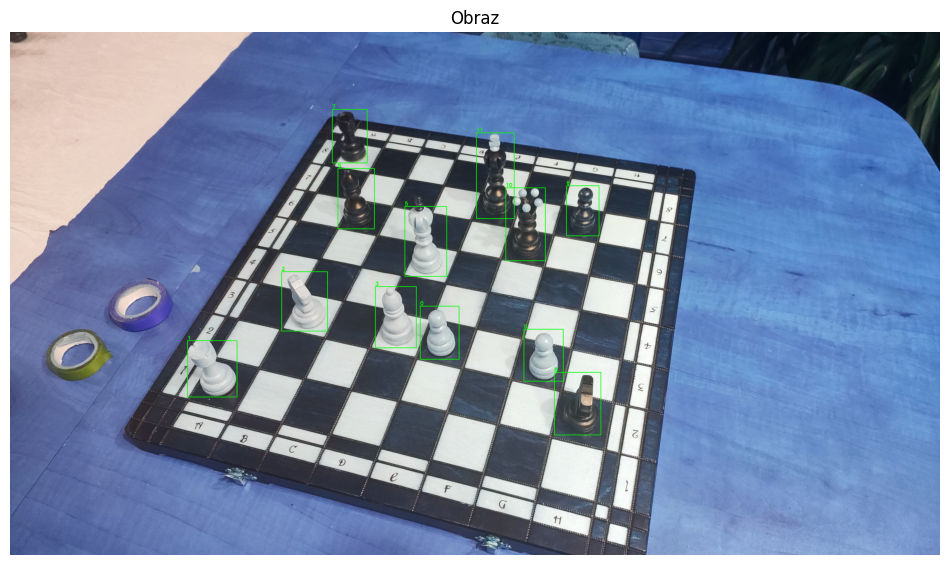

In [ ]:
import cv2
import os


# === Ścieżki do plików ===
image_path = "reinforce/images/train/position_1 (43).jpg"
label_path = "reinforce/labels/train/position_1 (43).txt"

# === Wczytaj obraz ===
image = cv2.imread(image_path)
h, w, _ = image.shape

# === Wczytaj labele YOLO ===
if os.path.exists(label_path):
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue  # pomiń błędne linie
            
            class_id, x_center, y_center, bw, bh = map(float, parts)
            class_id = int(class_id)
            
            # Zamiana YOLO → piksele
            x_center *= w
            y_center *= h
            bw *= w
            bh *= h
            
            x1 = int(x_center - bw / 2)
            y1 = int(y_center - bh / 2)
            x2 = int(x_center + bw / 2)
            y2 = int(y_center + bh / 2)
            
            # Rysowanie prostokąta
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Etykieta z numerem klasy
            cv2.putText(image, str(class_id), (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
else:
    print("Brak pliku labeli:", label_path)

# === Wyświetlenie ===
cv2.imshow("Obraz z labelami", image)
plot_cv(image)


📸 Otrzymano obraz:  544477  bajtów
(640, 480, 3)


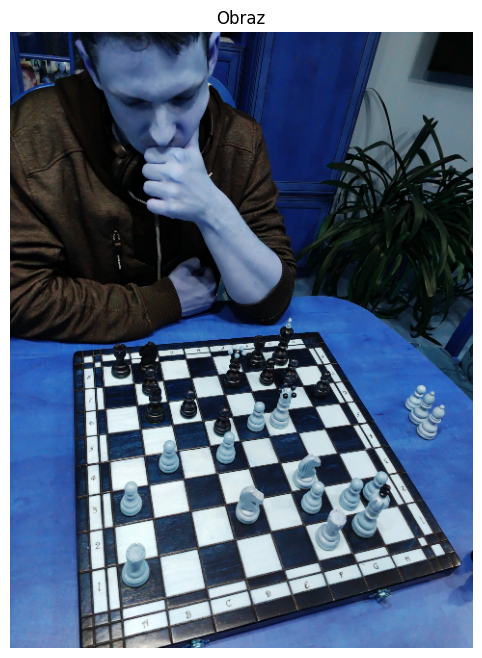


0: 640x480 1 chess_board, 56.8ms
Speed: 2.8ms preprocess, 56.8ms inference, 12.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\segment\predict108

0: 640x480 7 white-pawns, 1 white-rook, 3 white-knights, 1 white-bishop, 1 white-queen, 1 white-king, 7 black-pawns, 3 black-rooks, 1 black-knight, 1 black-bishop, 1 black-queen, 40.9ms
Speed: 2.9ms preprocess, 40.9ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict126
white-rook a1
white-pawn a3
white-knight d2
black-rook a8
white-pawn f2
black-pawn f7
black-rook f8
white-pawn b4
white-pawn h2
black-pawn d5
black-pawn h6
white-pawn g2
black-pawn c6
black-pawn b7
black-queen e7
white-pawn e5
black-pawn g7
white-pawn d4
black-bishop g8
white-queen f5
white-knight f3
black-knight b8
white-bishop g1
white-king f1
black-rook b6


In [ ]:
import chess_recognision_model

import asyncio
import websockets
import numpy as np
import cv2
import draw_helper
from IPython.display import clear_output
from ultralytics import YOLO
import json
model_s = YOLO("runs/yolo_chess4_finetune/weights/best.pt")
model_board_path = "runs/yolo_phone/weights/best.pt"
model_pieces_path = "runs/yolo_chess4_finetune1_1/weights/best.pt"
model = chess_recognision_model.ChessRecognisionModel(model_board_path, model_pieces_path)
labels = model_s.names

async def on_image_received(image):
    return await model.recognize_position_async(image)

async def handle(websocket):
    async for message in websocket:
        clear_output(wait=True)
        print("📸 Otrzymano obraz: ", len(message), " bajtów")

        nparr = np.frombuffer(message, np.uint8)

        image = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        print(image.shape)
        draw_helper.plot_cv(image)

        results = await on_image_received(image)
        for r in results:
            print(labels[r["id"]], r["position"])
        
        await websocket.send(json.dumps(results))

async def main():
    print("🚀 Serwer działa na ws://0.0.0.0:8765")
    async with websockets.serve(handle, "0.0.0.0", 8765):
        await asyncio.Future()

# asyncio.run(main())
await main()